The notebook follows from [parameter_scans](parameter_scans.ipynb).  It uses all the same helpers but focuses on comparing finite to infinite sersic integrals

In [1]:
import time

import numpy as np

from scipy import special, spatial, integrate

from astropy import units as u

from matplotlib import pyplot as plt 

import sympy
from sympy.printing.numpy import SciPyPrinter

import nautilus 
import corner

# Hull helpers

In [2]:
def plot_hull(hull, **kw):
    pts = hull.points[hull.vertices]
    extended_pts = np.concatenate([pts, pts[:1]])  # Close the polygon

    return plt.plot(extended_pts[:, 0], extended_pts[:, 1], **kw)


def in_hull(xs, ys, hull):
    pts = np.array([xs, ys]).T
    return spatial.Delaunay(hull.points[hull.vertices]).find_simplex(pts) >= 0

# Data-generation Functions

In [3]:
def sersic_distribution(U, Re, n, Router=np.inf):
    bn = f_bn(n)

    integral = Re**2*bn**(-2*n)*n*np.exp(bn)*special.gamma(2*n)*special.gammainc(2*n, Re**(-1/n)*bn*Router**(n**(-1.0)))

    sympy_gamma =  U*bn**(2*n)*np.exp(-bn)/(Re**2*n) * integral

    gamma_arg = special.gammaincinv(2*n, sympy_gamma / special.gamma(2*n))
    
    return Re*(gamma_arg/bn)**n

def sersic_plus_uniform_circle(ntotal, fbkg, n, Re=1, Router=10, x0=0, y0=0, flattening=0, pa=0*u.deg):
    nbkg = int(ntotal*fbkg)
    nfg = ntotal - nbkg

    bovera = 1-flattening
    a = Re/np.sqrt(bovera)
    #b = a*bovera

    r_bkg = np.sqrt(np.random.rand(nbkg))*Router
    θ_bkg = np.random.rand(nbkg)*2*np.pi

    x_bkg = r_bkg*np.cos(θ_bkg)
    y_bkg = r_bkg*np.sin(θ_bkg)

    ntot = 0
    x_fg = []
    y_fg = []
    while ntot < nfg:
        r_fg = sersic_distribution(np.random.rand(nfg), a, n, Router)
        θ_fg = np.random.rand(nfg)*2*np.pi

        x_fgi = r_fg*np.cos(θ_fg) * bovera
        y_fgi = r_fg*np.sin(θ_fg)

        msk = np.hypot(x_fgi+x0, y_fgi+y0) < Router
        ntot += np.sum(msk)

        x_fg.append(x_fgi[msk])
        y_fg.append(y_fgi[msk])
    x_fg = np.concatenate(x_fg)[:nfg] + x0
    y_fg = np.concatenate(y_fg)[:nfg] + y0
    

    xp = np.concatenate([x_fg, x_bkg])
    yp = np.concatenate([y_fg, y_bkg])

    spa = np.sin(pa)
    cpa = np.cos(pa)
    
    x = xp*cpa + yp*spa
    y = -xp*spa + yp*cpa
    
    return x, y, nfg

In [4]:
def sersic_plus_uniform_inhull(hull, ntotal, fbkg, nsersic, Re=1, x0=0, y0=0, flattening=0, pa=0*u.deg):
    nbkg = int(ntotal*fbkg)
    nfg = ntotal - nbkg

    bovera = 1-flattening
    a = Re/np.sqrt(bovera)
    #b = a*bovera

    xh, yh = hull.points[hull.vertices].T
    dx = np.ptp(xh)
    xmin = np.min(xh)
    dy = np.ptp(yh)
    ymin = np.min(yh)

    n = 0 
    x_bkgs = []
    y_bkgs = []
    while n < nbkg:
        x = np.random.rand(nfg)*dx + xmin
        y = np.random.rand(nfg)*dy + ymin

        msk = in_hull(x, y, hull)

        x_bkgs.append(x[msk])
        y_bkgs.append(y[msk])
        n += np.sum(msk)

    x_bkgs = np.concatenate(x_bkgs)[:nbkg]
    y_bkgs = np.concatenate(y_bkgs)[:nbkg]


    Router = np.hypot(xh-x0, yh-y0).max()/bovera
    spa = np.sin(np.radians(pa))
    cpa = np.cos(np.radians(pa))

    n = 0
    x_fg = []
    y_fg = []
    while n < nfg:
        r_fgi = sersic_distribution(np.random.rand(nfg), a, nsersic, Router)
        θ_fgi = np.random.rand(nfg)*2*np.pi

        xip = r_fgi*np.cos(θ_fgi) * bovera
        yip = r_fgi*np.sin(θ_fgi)

        xi = xip*cpa + yip*spa + x0
        yi = -xip*spa + yip*cpa + y0

        msk = in_hull(xi, yi, hull)

        x_fg.append(xi[msk])
        y_fg.append(yi[msk])
        n += np.sum(msk)

    x_fg = np.concatenate(x_fg)[:nfg]
    y_fg = np.concatenate(y_fg)[:nfg]

    xp = np.concatenate([x_fg, x_bkgs])
    yp = np.concatenate([y_fg, y_bkgs])

    return xp, yp, nfg

# Inference-related functions

In [5]:
BN_ICOEFFS = [2, -1/3, 4/405, 46/25515, 131/1148175, -2194697/30690717750]

def f_bn(n):
    """
    Ciotti and Bertin 99, valid for n >~ 0.36
    """
    return np.sum([C*n**(1-i) for i, C in enumerate(BN_ICOEFFS)], axis=0)

# def sersic_profile(R, Ie, Re, n):
#     bn = f_bn(n)
#     return Ie * np.exp(-bn*((R/Re)**(1/n)-1))

def log_sersic_profile(R, Ie, Re, n):
    bn = f_bn(n)
    return np.log(Ie) - bn*((R/Re)**(1/n)-1)

In [6]:
def dimensionless_path_integrand(x, y, Δx, Δy, Re, n):
    bn = f_bn(n)
    Rsq = x*x + y*y
    twon = 2*n
    segments = Re**2*bn**(-twon)*n*(x*Δy - y*Δx)*np.exp(bn)*special.gamma(twon)*special.gammainc(twon, Re**(-1/n)*bn*Rsq**(1/twon))/Rsq
    return np.sum(segments)

def sersic_integrate_hull(hull, n_per_segment, n, Re):
    vertxys = hull.points[hull.vertices].T
    edgexys = np.linspace(vertxys, np.roll(vertxys,-1, axis=-1), n_per_segment).T
    integral_of_segments = [dimensionless_path_integrand(x, y, x[1]-x[0], y[1]-y[0], Re=Re, n=n) for x,y in edgexys]
    return np.sum(integral_of_segments)

In [7]:
def loglikes(param_dict, data, hull, n_per_segment):#, noglx=False):
    x0 = param_dict['x0']
    y0 = param_dict['y0']
    Re = param_dict['Re']
    n = param_dict['n']
    fbkg = param_dict['fbkg']

    c = 1 - param_dict['flattening'] # = b/a
    a = Re/np.sqrt(c)

    parad = np.radians(param_dict['pa'])
    cpa = np.cos(parad)
    spa = np.sin(parad)

    xh, yh = hull.points.T
    # is the sign right here?
    xph = (xh*cpa + yh*spa)/c
    yph = -xh*spa + yh*cpa

    newhull = spatial.ConvexHull(np.array((xph, yph)).T)

    logbg = -np.log(hull.volume) #"volume" of a hull is actually 2d area THIS IS THE KEY DIFFERENCE!
    # should this be newhull.volume?

    # if noglx:
    #     return logbg*np.ones_like(data[0])
    
    x = data[0] - x0
    y = data[1] - y0

    xp = ((x*cpa - y*spa))/c
    yp =  x*spa + y*cpa
    R = np.hypot(xp, yp)

    logfg = log_sersic_profile(R, 1, a, n) - np.log(sersic_integrate_hull(newhull, n_per_segment, n, a)) - np.log(c)
 
    return np.logaddexp(np.log(1-fbkg) + logfg, np.log(fbkg) + logbg)

def loglike(*args, **kwargs):
    return np.sum(loglikes(*args, **kwargs))


In [8]:
def infer_and_plot(hullorrouter,# number means the circular radius from the center, hull derived from the generated points
                   x0=0, # center of galaxy
                   y0=0, # center of galaxy
                   Re=1,
                   nsersic=2,
                   fbkg=.5,
                   flattening=0.4,
                   pa=30*u.deg,
                   ntotal=1000,
                   llplot=False,
                   genplot=True,
                   priorrngs={},
                   samplerkwargs={},
                   n_per_segment=1000,
                   loglike=loglike):
    samplerkwargs = samplerkwargs.copy()
    samplerkwargs.setdefault('n_live', 1000)
    samplerkwargs.setdefault('pool', 16)

    priorrngs = priorrngs.copy()
    priorrngs.setdefault('x0', (-2.5, 2.5))
    priorrngs.setdefault('y0', (-2.5, 2.5))
    priorrngs.setdefault('Re', (0.1, 2))
    priorrngs.setdefault('n', (0.36, 4))
    priorrngs.setdefault('fbkg', (0.1, 0.9))
    priorrngs.setdefault('flattening', (0, .9))
    priorrngs.setdefault('pa', (0, 180))

    truths = [x0, y0, Re, nsersic, fbkg, flattening, pa.to_value(u.deg)]

    if isinstance(hullorrouter, (int, float)):
        xp, yp, exact_nfg = sersic_plus_uniform_circle(ntotal, fbkg, nsersic, Re, Router=hullorrouter, x0=x0, y0=y0, flattening=flattening, pa=pa)
        hull = spatial.ConvexHull(np.array((xp, yp)).T)
    elif isinstance(hullorrouter, spatial.ConvexHull):
        xp, yp, exact_nfg = sersic_plus_uniform_inhull(hullorrouter, ntotal, fbkg, nsersic, Re, x0=x0, y0=y0, flattening=flattening, pa=pa)
        hull = hullorrouter
    else: # assume its data points
        xp, yp = hullorrouter
        assert len(xp) == len(yp) == ntotal, "Data points must match ntotal"
        hull = spatial.ConvexHull(np.array((xp, yp)).T)


    prior = nautilus.Prior()
    for key in ['x0', 'y0', 'Re', 'n', 'fbkg', 'flattening', 'pa']:
        prior.add_parameter(key, priorrngs[key])

    sampler = nautilus.Sampler(prior, loglike, likelihood_kwargs=dict(data=(xp, yp), hull=hull, n_per_segment=n_per_segment), **samplerkwargs)

    t_start = time.time()
    sampler.run(verbose=True)
    t_end = time.time()

    dt = t_end - t_start

    figs = []

    points, log_w, log_l = sampler.posterior()
    w = np.exp(log_w)
    corner.corner(
        points, weights=w, bins=25, labels=sampler.prior.keys,
        plot_datapoints=False, range=np.repeat(0.999, len(sampler.prior.keys)), 
        quantiles=[0.16, 0.5, 0.84],
        show_titles=True,
        truths=truths)
    figs.append(plt.gcf())

    meddct = {k:v for k, v in zip(sampler.prior.keys, np.percentile(points, 50,  weights=w, method='inverted_cdf', axis=0))}
    if llplot:
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 7))
        figs.append(fig)

        sc1 = ax1.scatter(xp, yp, c=loglikes(meddct,data=(xp, yp), hull=hull, n_per_segment=1000), s=2, alpha=.5)
        plt.colorbar(sc1, ax=ax1).set_label('median parameters log-like')

        sc2 = ax2.scatter(xp, yp, c=loglikes({k:v for k, v in zip(sampler.prior.keys, truths)},data=(xp, yp), hull=hull, n_per_segment=1000), s=2, alpha=.5)
        plt.colorbar(sc2, ax=ax2).set_label('true parameters log-like')

    if genplot:
        fig, ax = plt.subplots(1, 1, figsize=(7, 7))

        ax.scatter(xp, yp, c='C0', s=2, alpha=.5, label='data')

        xgen, ygen, _ = sersic_plus_uniform_inhull(hull, 
                                                   ntotal, 
                                                   meddct['fbkg'], 
                                                   meddct['n'], 
                                                   meddct['Re'], 
                                                   x0=meddct['x0'], y0=meddct['y0'], 
                                                   flattening=meddct['flattening'], 
                                                   pa=meddct['pa'])
        ax.scatter(xgen, ygen, c='C1', s=2, alpha=.5, label='generated from median')

        ax.legend(loc=0)

    return figs, sampler, (xp, yp), dt

# Compute the infinite integral

In [9]:
R, Ie, Re, n, bn = sympy.symbols('R, I_e, R_e, n, b_n', real=True, positive=True)

sersic_func = Ie * sympy.exp(-bn*((R/Re)**(1/n)-1))

sersic_func

I_e*exp(-b_n*((R/R_e)**(1/n) - 1))

In [10]:
srint = sympy.integrate(sersic_func*R, (R, 0, sympy.oo))
srint

I_e*R_e**(1/n)*n*(b_n/R_e**(1/n))**(1 - 2*n)*exp(b_n)*gamma(2*n)/b_n

In [11]:
normalized_sersic = (sersic_func/srint).simplify()
normalized_sersic

2*b_n**(2*n)*exp(-R**(1/n)*b_n/R_e**(1/n))/(R_e**2*gamma(2*n + 1))

In [12]:
SciPyPrinter().doprint(normalized_sersic).replace('numpy.','np.').replace('scipy.special', 'special').replace('_','')

'2*bn**(2*n)*np.exp(-R**(n**(-1.0))*Re**(-1/n)*bn)/(Re**2*special.gamma(2*n + 1))'

In [13]:
def normalized_sersic_profile(R, Re, n):
    bn = f_bn(n)
    return 2*bn**(2*n)*np.exp(-R**(n**(-1.0))*Re**(-1/n)*bn)/(Re**2*special.gamma(2*n + 1))

# should be 0.5 at Re, and 1 at infinity 1 for all of these
(integrate.quad(lambda R:normalized_sersic_profile(R, 1, 2)*R, 0, 1),
 integrate.quad(lambda R:normalized_sersic_profile(R, 2, 2.5)*R, 0, 2),
 integrate.quad(lambda R:normalized_sersic_profile(R, 1, 2)*R, 0, 2),
 integrate.quad(lambda R:normalized_sersic_profile(R, 1, 2)*R, 0, 10),
 integrate.quad(lambda R:normalized_sersic_profile(R, 1, 2)*R, 0, 10000))

((0.5000009854830296, 1.7070789226636407e-11),
 (0.5000004327667911, 2.2368207286405095e-10),
 (0.7610391981817578, 1.8398171874878244e-10),
 (0.9969119629380292, 3.625127753537072e-09),
 (1.0, 1.203981359054751e-11))

In [14]:
LOGOF2 = np.log(2)
def normalized_log_sersic_profile(R, Re, n):
    bn = f_bn(n)
    return LOGOF2 + 2*n*np.log(bn) - R**(n**(-1.0))*Re**(-1/n)*bn - np.log(Re**2*n*special.gamma(2*n))

# Do some comparisons to the infinite integral

One subtlety here: the relative weighting of the bg and fg is set by the area of the footprint even when the sersic integral is infinite.  In practice that means the hull around the background actually serves to set the background vs foreground weighting.

In [15]:
def loglikes_inf(param_dict, data, hull, n_per_segment):
    x0 = param_dict['x0']
    y0 = param_dict['y0']
    Re = param_dict['Re']
    n = param_dict['n']
    fbkg = param_dict['fbkg']

    c = 1 - param_dict['flattening'] # = b/a
    a = Re/np.sqrt(c)

    parad = np.radians(param_dict['pa'])
    cpa = np.cos(parad)
    spa = np.sin(parad)

    #xh, yh = hull.points.T
    # is the sign right here?
    #xph = (xh*cpa + yh*spa)/c
    #yph = -xh*spa + yh*cpa

    #newhull = spatial.ConvexHull(np.array((xph, yph)).T)

    logbg = -np.log(hull.volume) 
    
    x = data[0] - x0
    y = data[1] - y0

    xp = ((x*cpa - y*spa))/c
    yp =  x*spa + y*cpa
    R = np.hypot(xp, yp)

    #logfg = log_sersic_profile(R, 1, a, n) - np.log(sersic_integrate_hull(newhull, n_per_segment, n, a)) - np.log(c)
    logfg = normalized_log_sersic_profile(R, a, n) - np.log(c)
    
 
    return np.logaddexp(np.log(1-fbkg) + logfg, np.log(fbkg) + logbg)

def loglike_inf(*args, **kwargs):
    return np.sum(loglikes_inf(*args, **kwargs))


First do a test round with a large radius. Shouldn't do too bad in either case, although the fbkg might be nonesense, so we try forcing it to the correct value or not.

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 34     | 1        | 4        | 38304    | N/A    | 10163 | -4849.36 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 44     | 1        | 4        | 49504    | N/A    | 11702 | -2739.29 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 33     | 1        | 4        | 37744    | N/A    | 10105 | -3151.18 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 42     | 1        | 4        | 47712    | N/A    | 11851 | -2

(55.88891053199768,
 62.1275200843811,
 43.8164541721344,
 61.019784688949585,
 54.159056663513184)

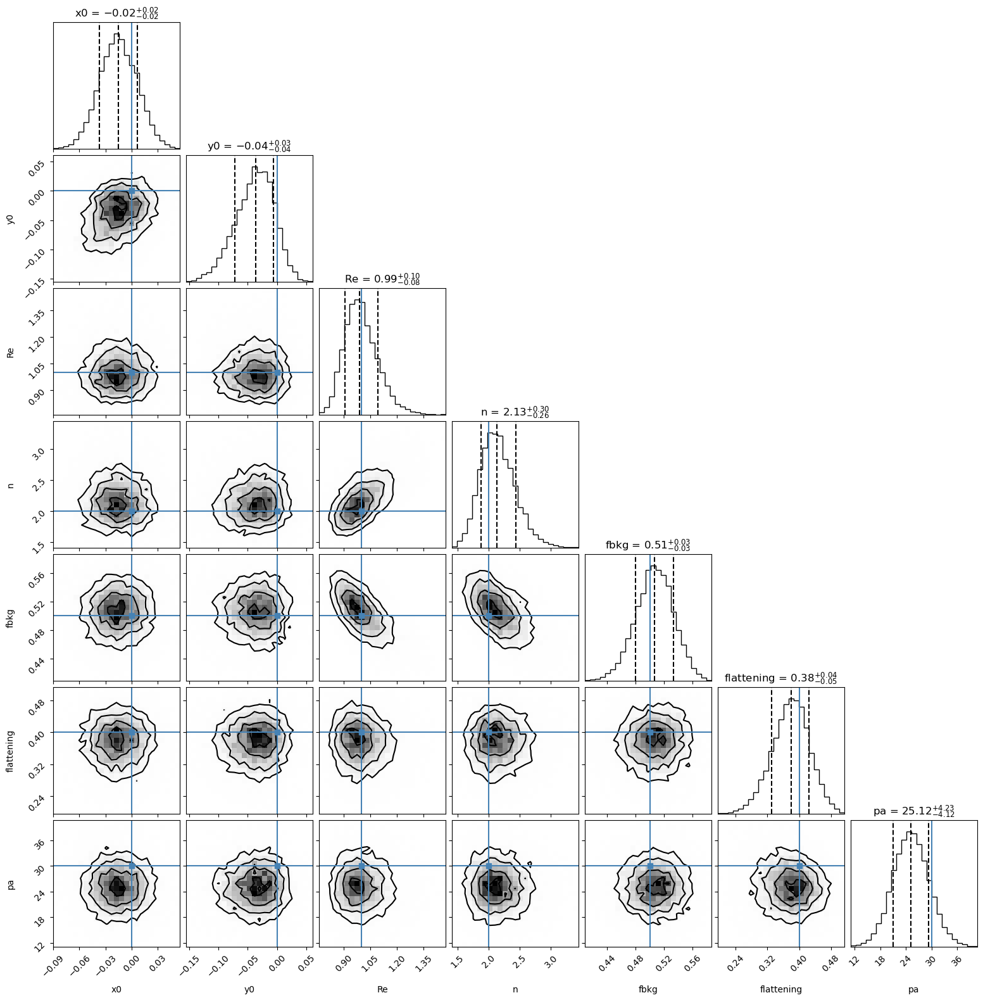

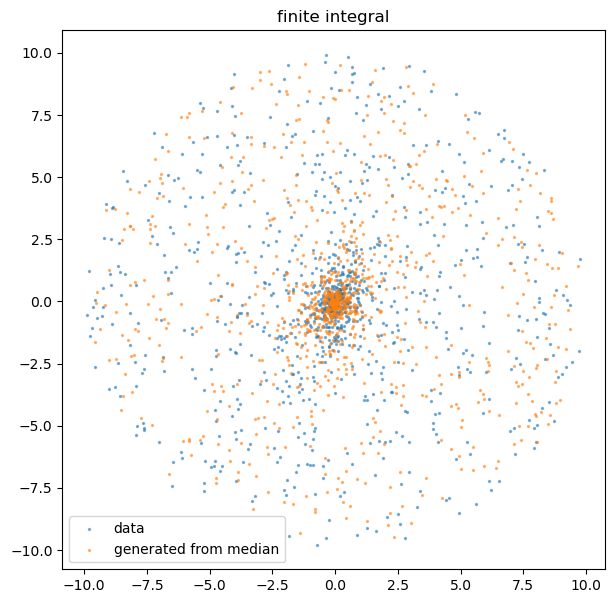

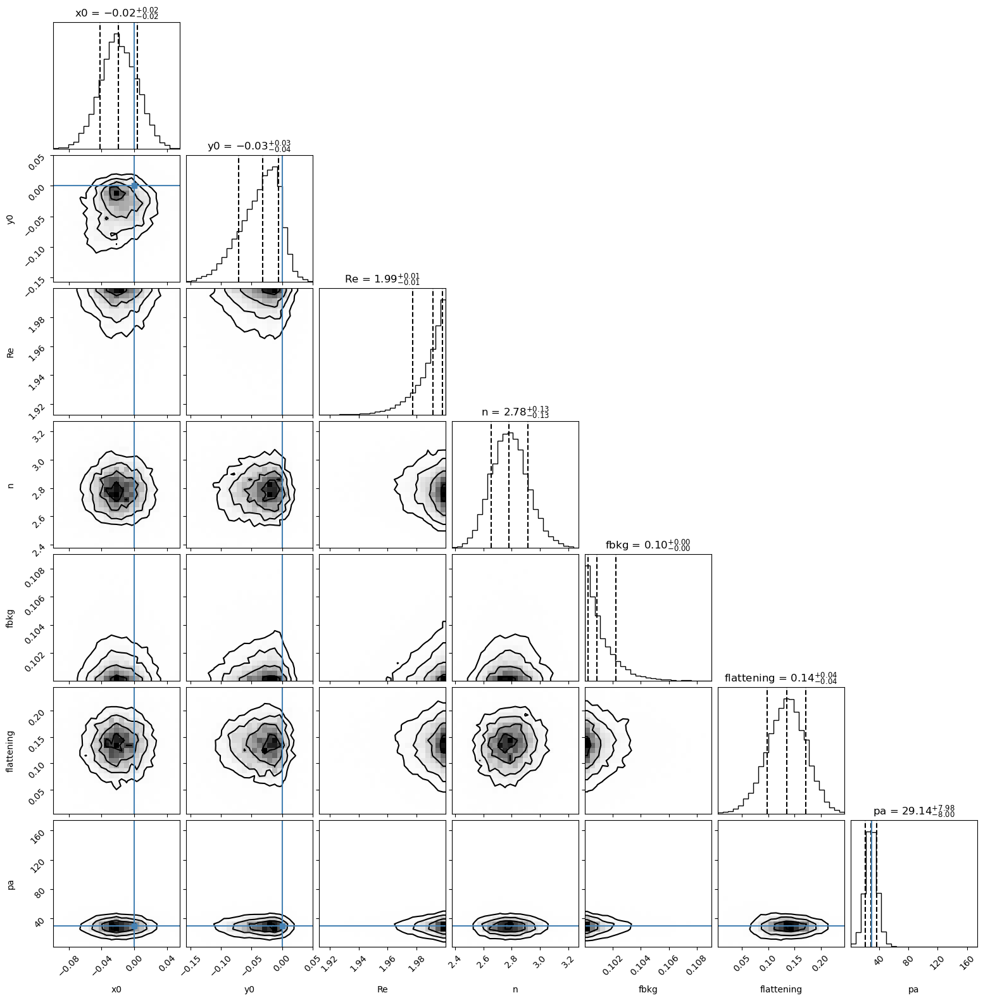

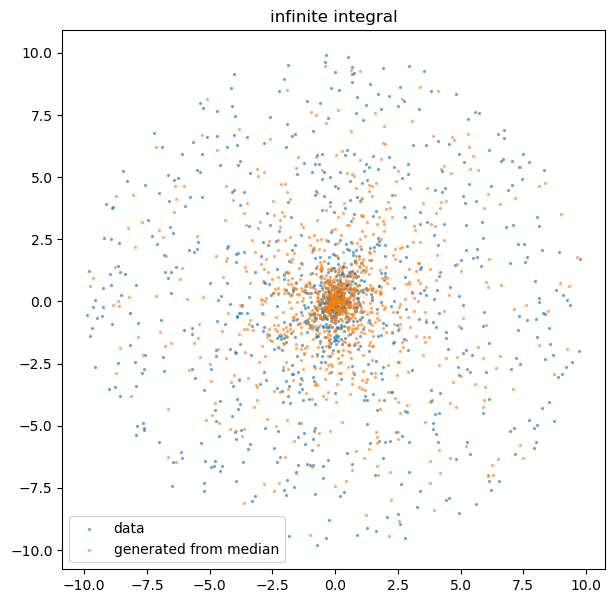

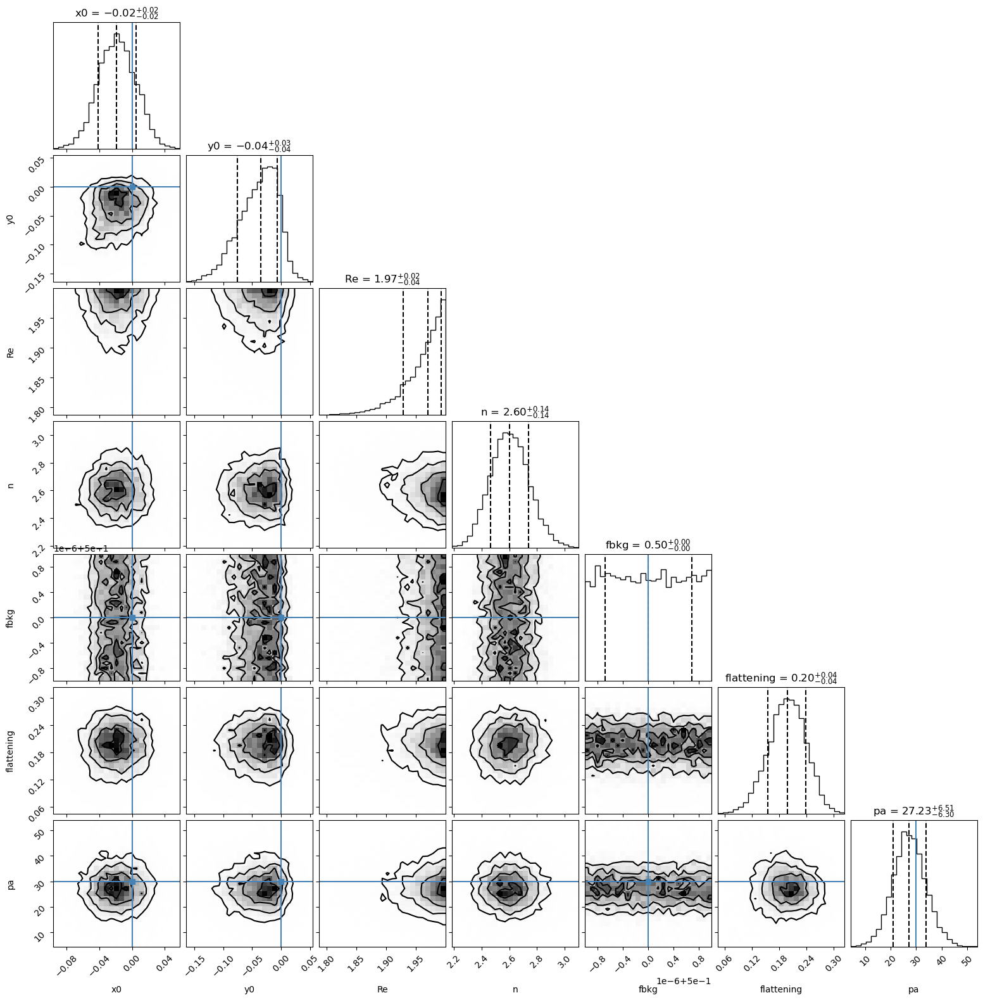

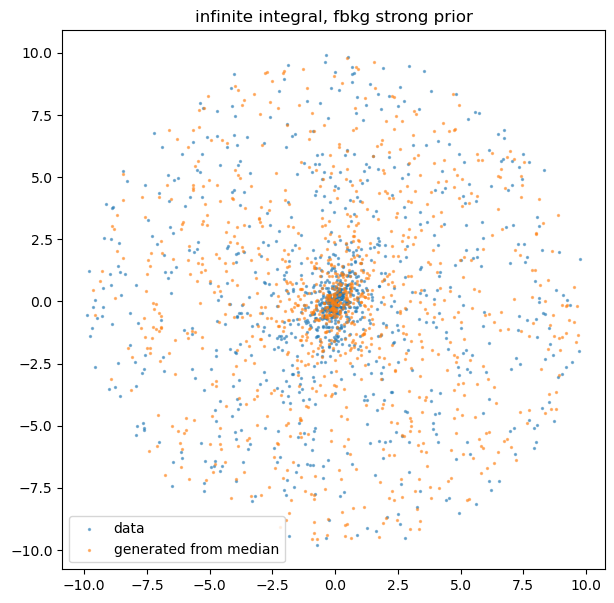

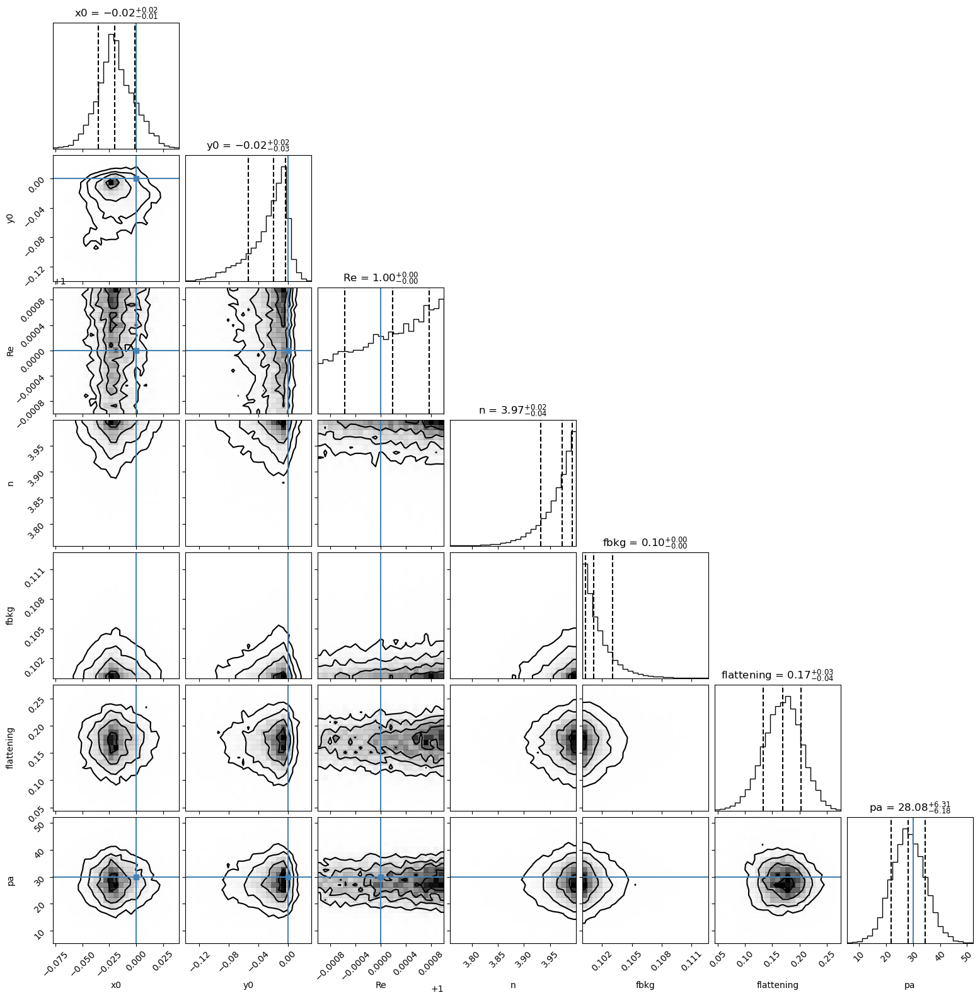

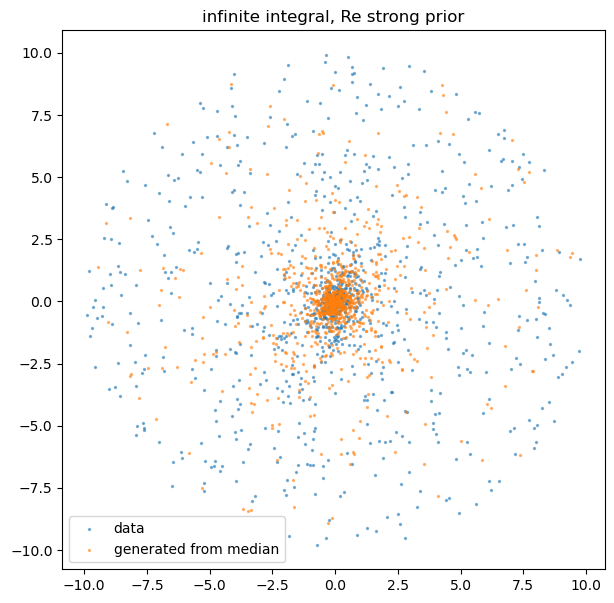

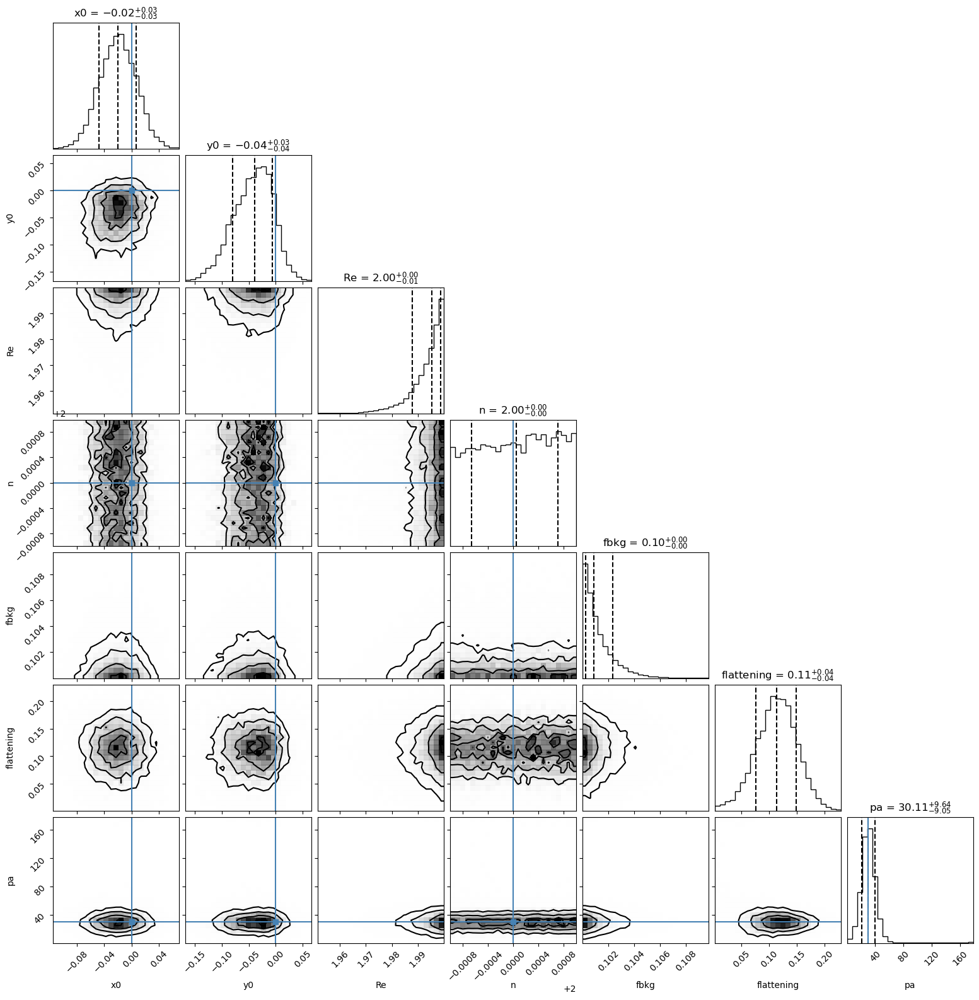

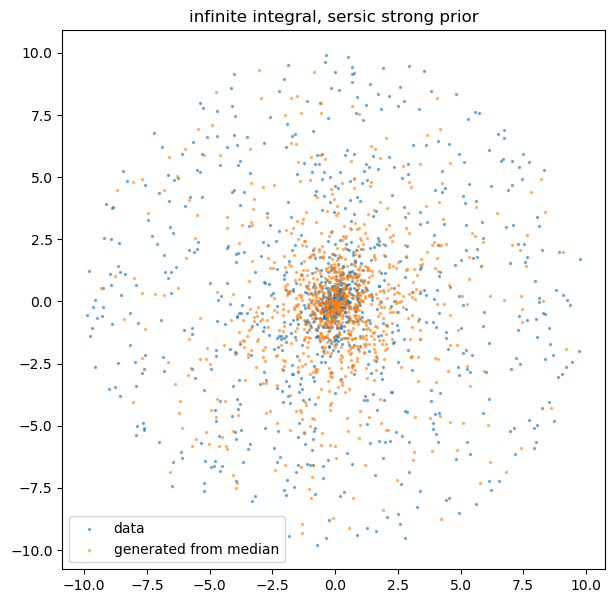

In [16]:
kwargs = dict(hullorrouter=10.,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=1,
                nsersic=2,
                fbkg=.5,
                flattening=0.4,
                pa=30*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.999,1.001)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')

# force sersic to be about right
kwargs['priorrngs'] = {'n': (1.999,2.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

Now try with a more flattened distribution

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 37     | 1        | 4        | 42112    | N/A    | 10027 | -4761.73 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 46     | 1        | 4        | 52080    | N/A    | 11285 | -2714.39 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 34     | 1        | 4        | 38864    | N/A    | 10133 | -3112.23 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 43     | 1        | 4        | 49280    | N/A    | 10943 | -2

(63.34480118751526,
 67.32614016532898,
 45.476961851119995,
 65.71661186218262,
 59.771427154541016)

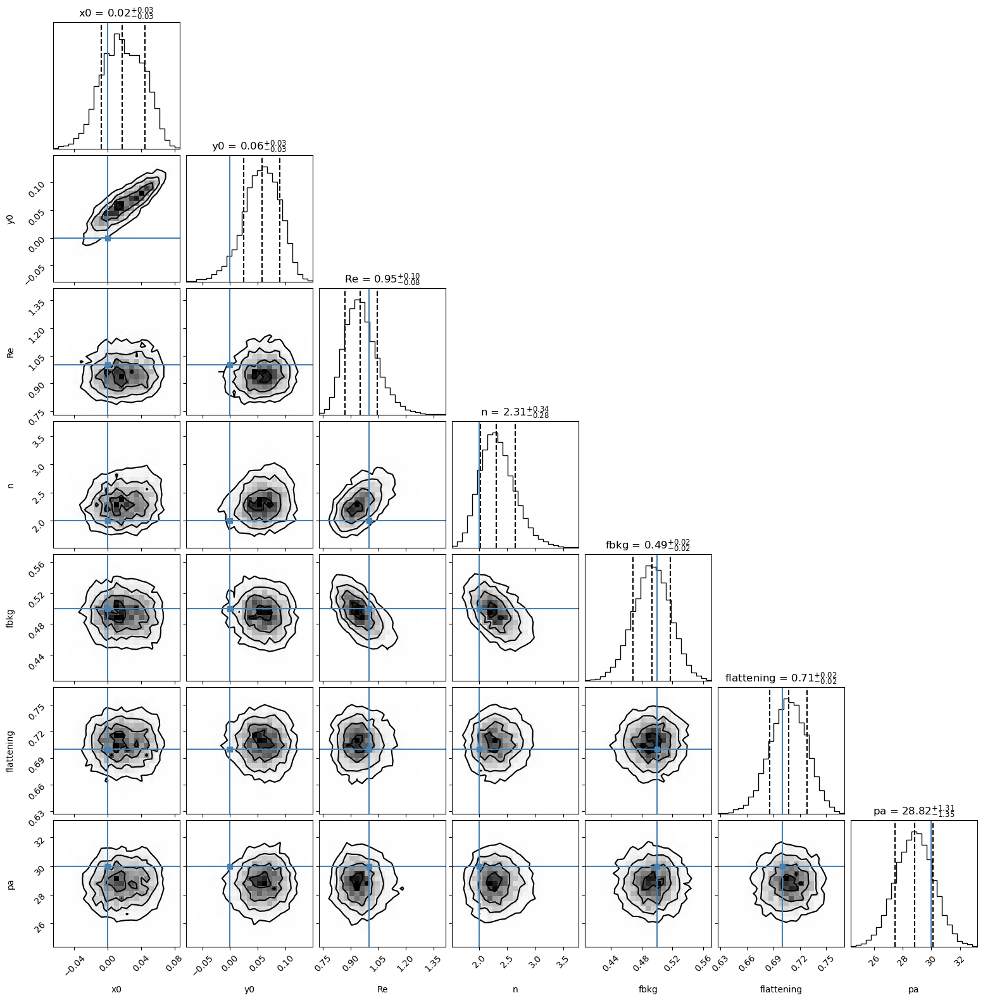

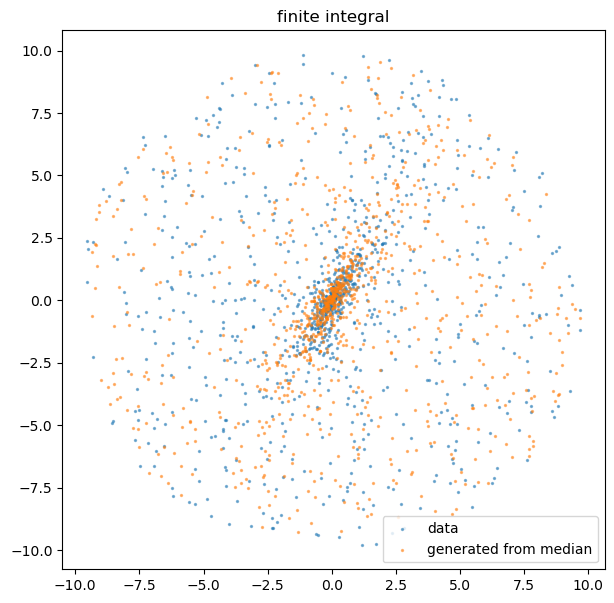

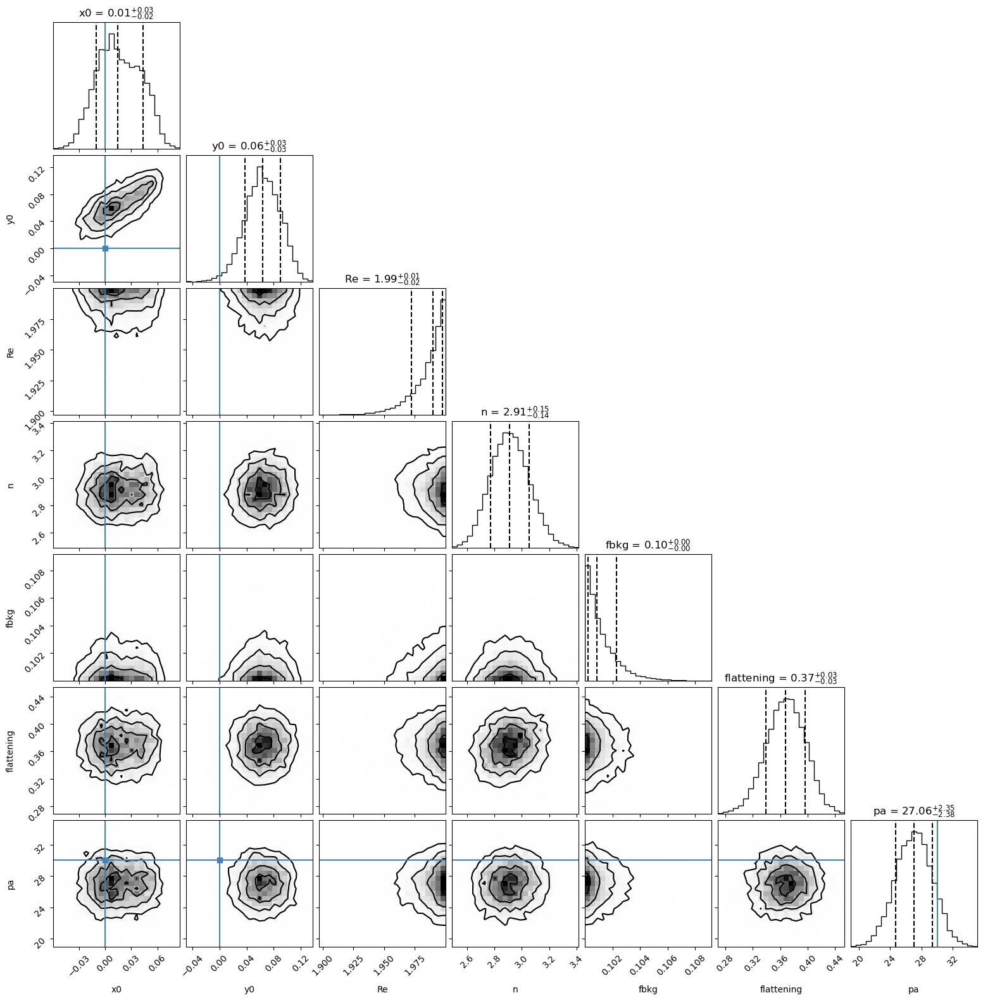

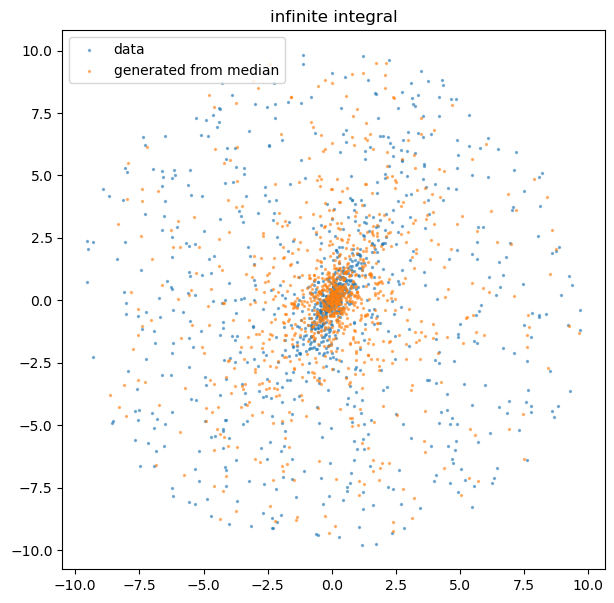

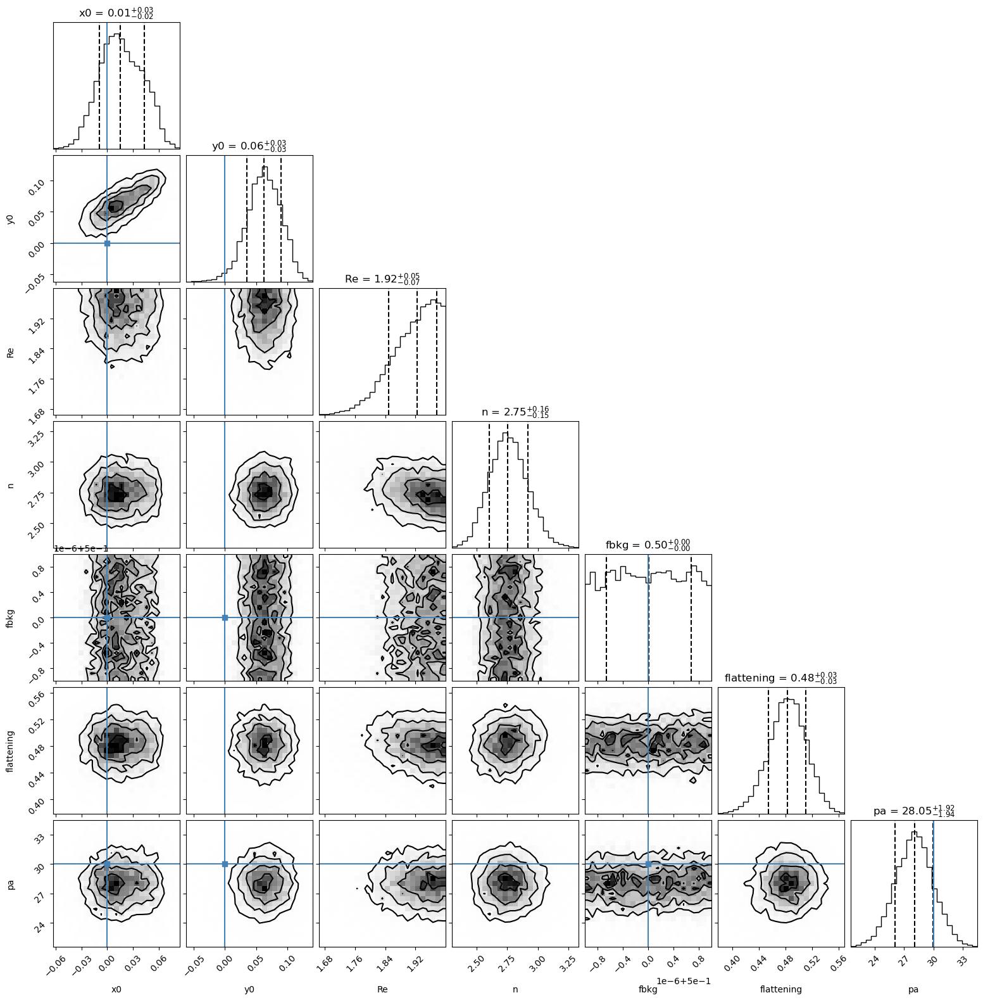

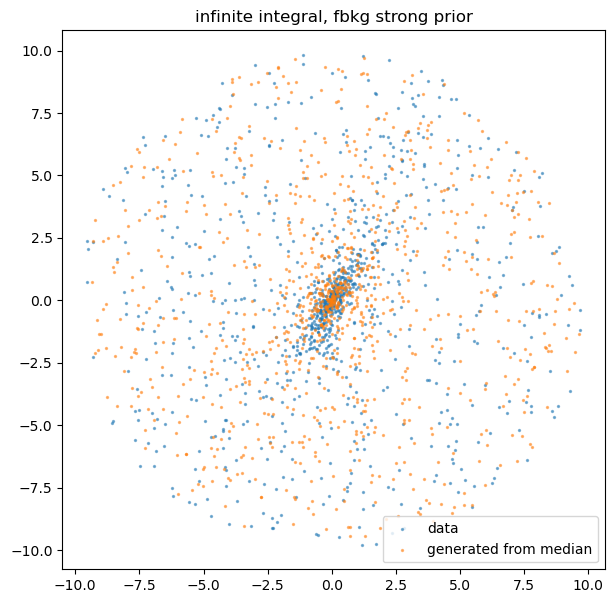

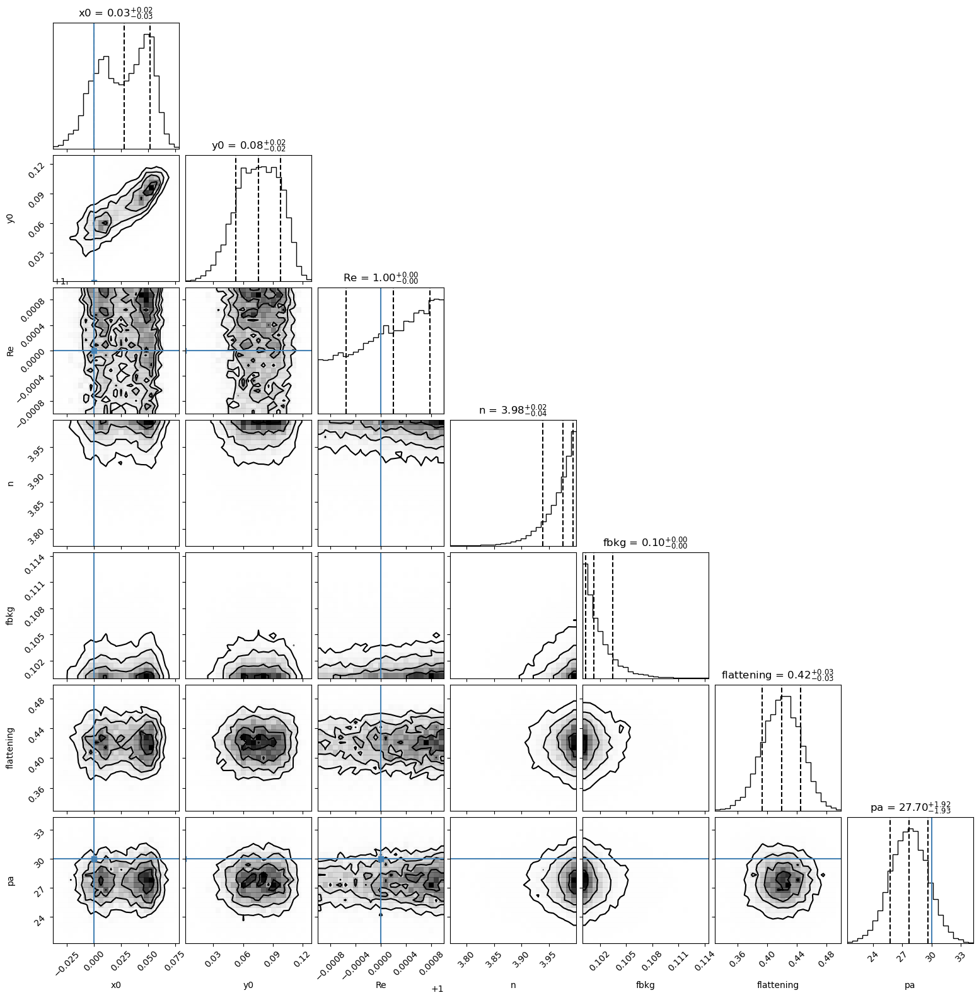

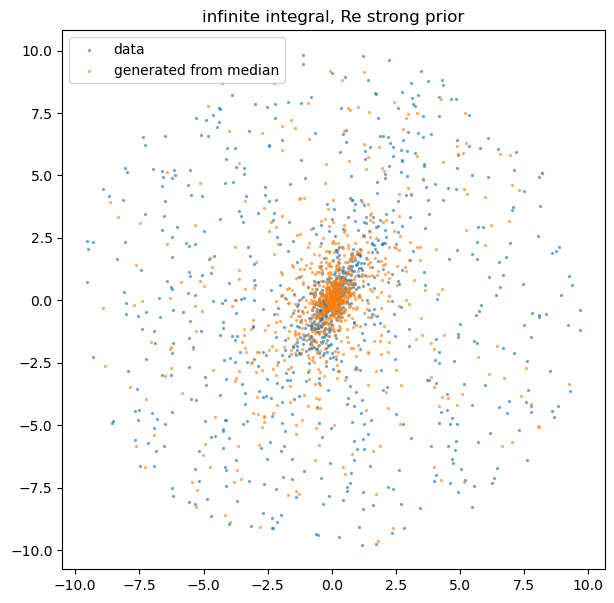

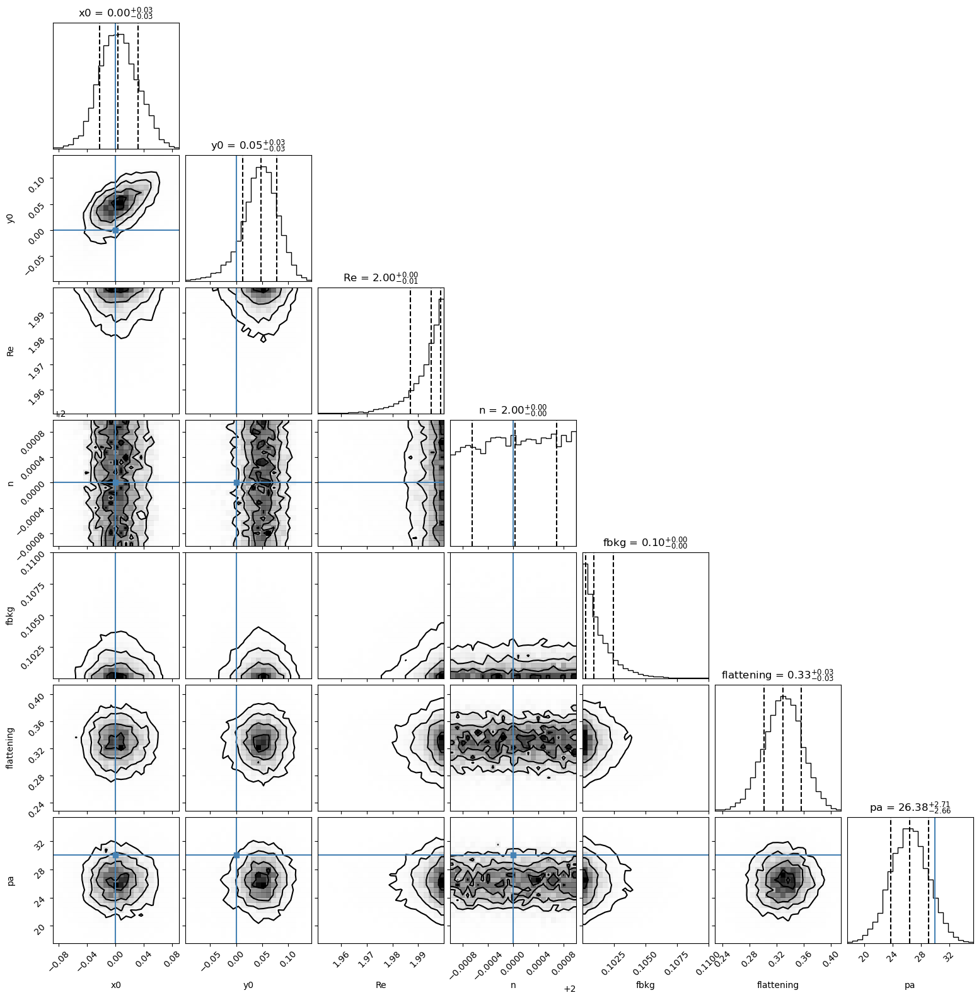

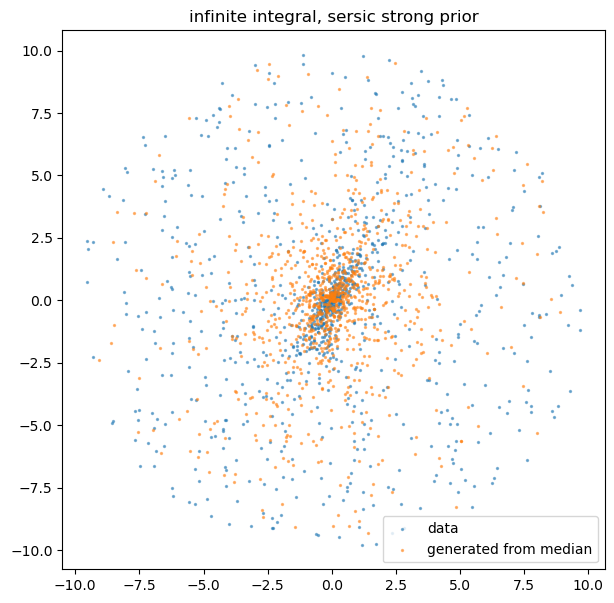

In [17]:
kwargs = dict(hullorrouter=10.,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=1,
                nsersic=2,
                fbkg=.5,
                flattening=0.7,
                pa=30*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.999,1.001)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')

# force sersic to be about right
kwargs['priorrngs'] = {'n': (1.999,2.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

Or a much closer-in circle

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 31     | 1        | 4        | 35504    | N/A    | 10125 | -2273.44 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 43     | 1        | 4        | 48608    | N/A    | 10649 | -9.46    
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 34     | 1        | 4        | 38752    | N/A    | 10068 | -494.40  
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 38     | 1        | 4        | 43344    | N/A    | 10173 | -6

(59.1063117980957,
 55.070311307907104,
 41.49926733970642,
 48.60017108917236,
 50.219162940979004)

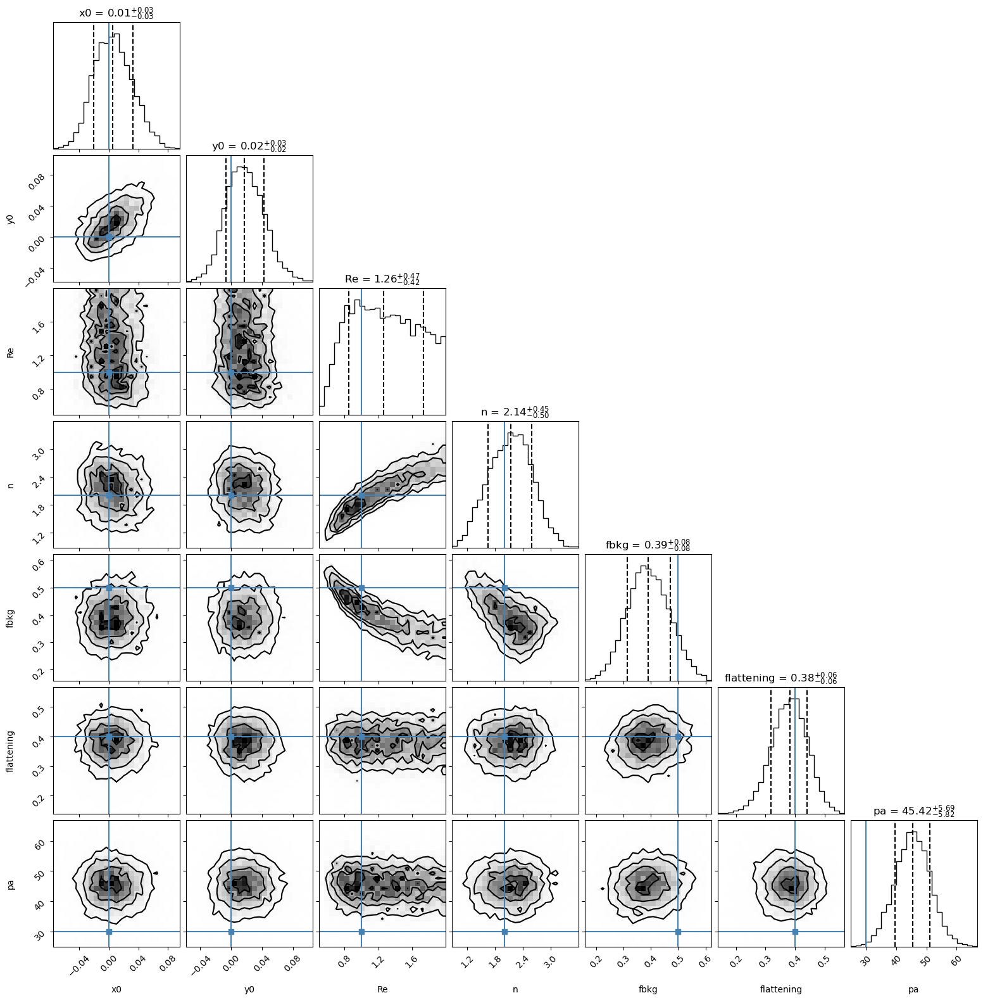

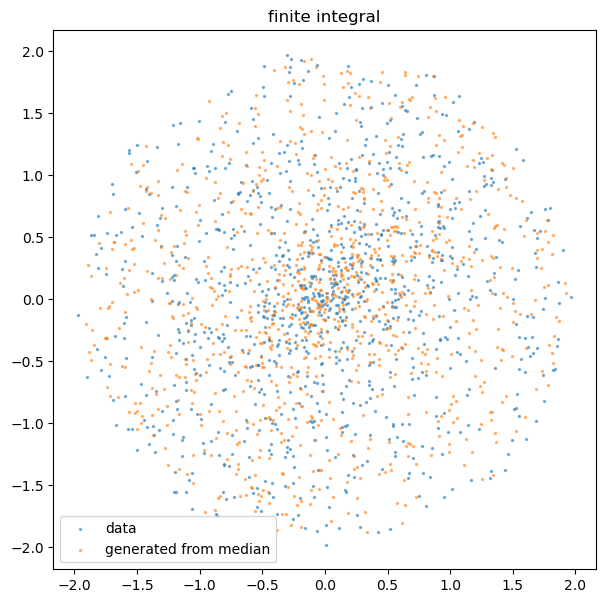

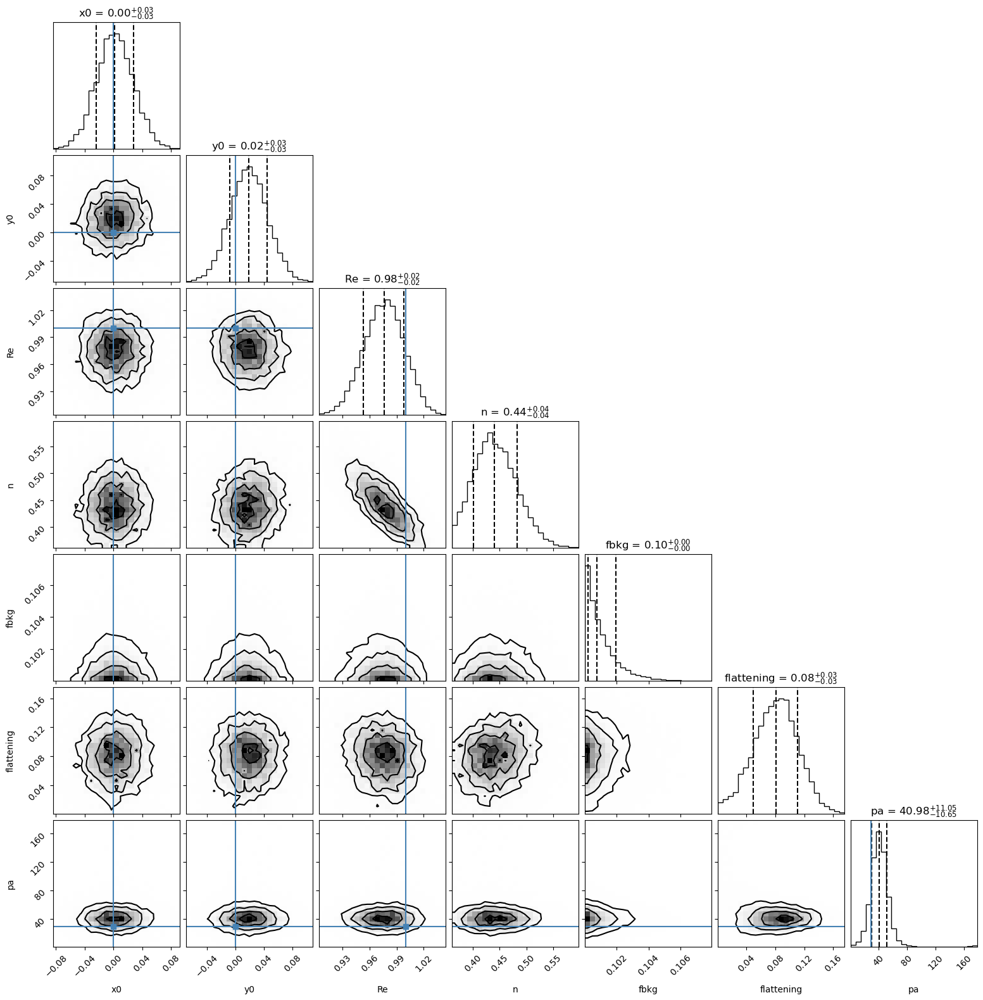

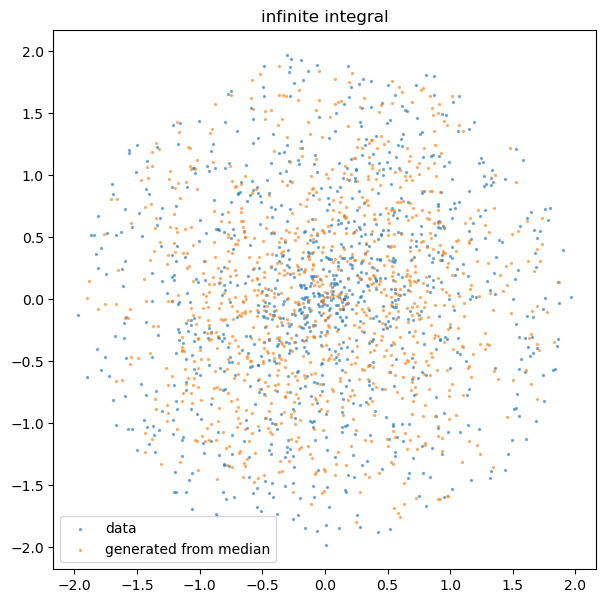

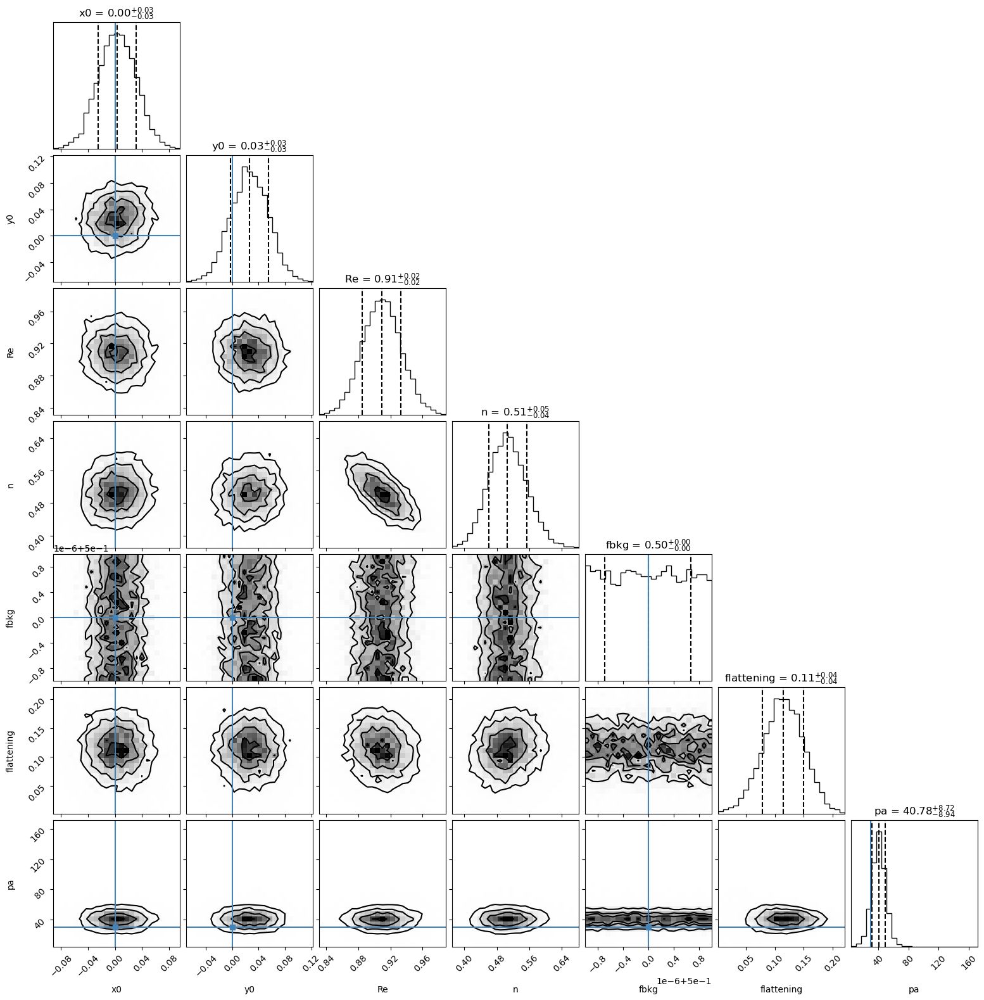

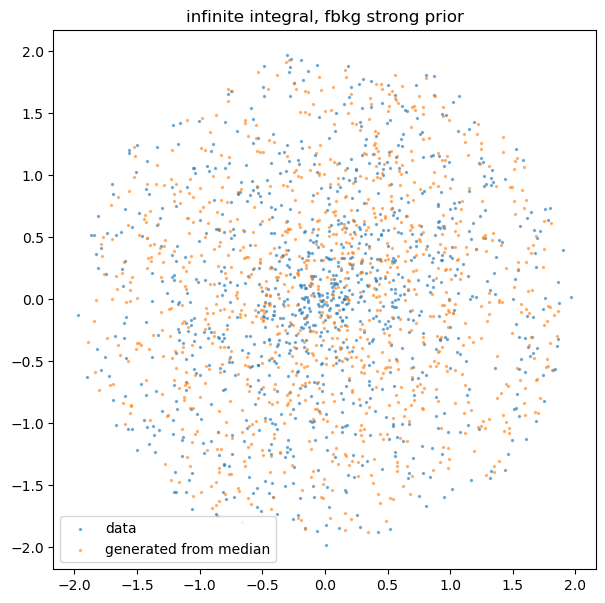

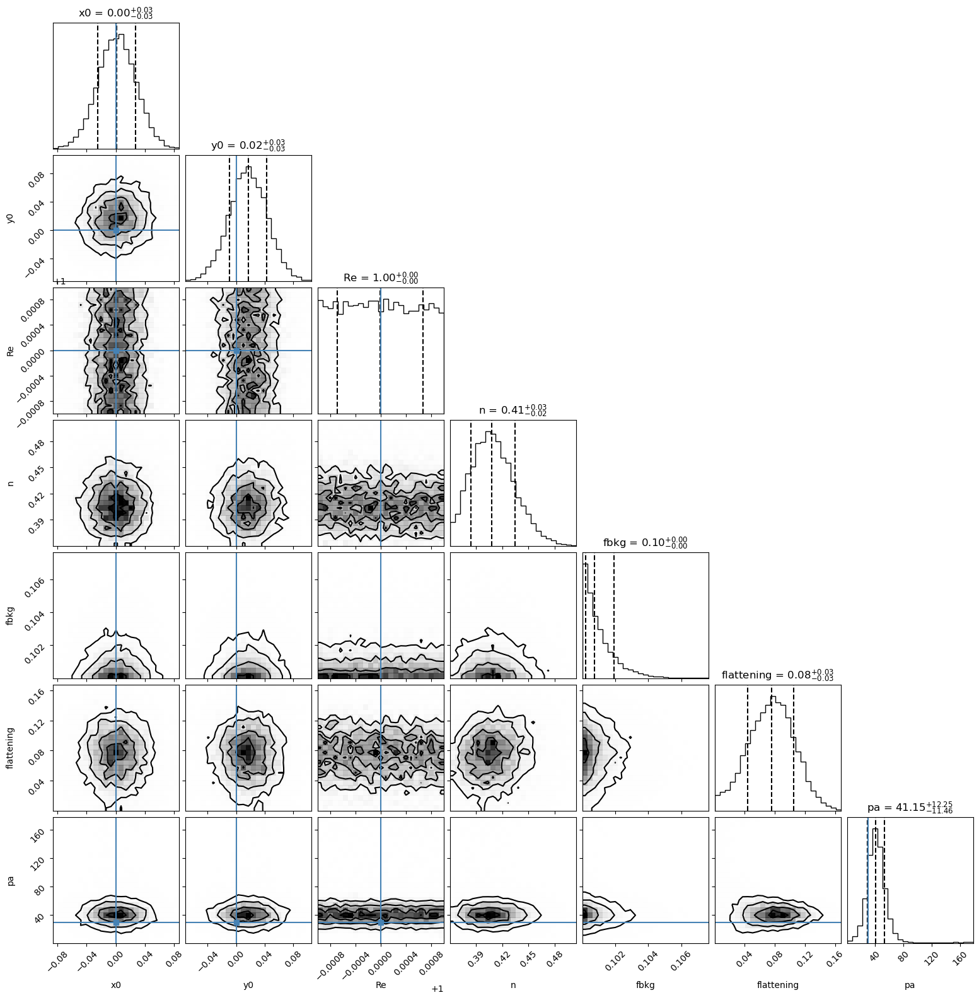

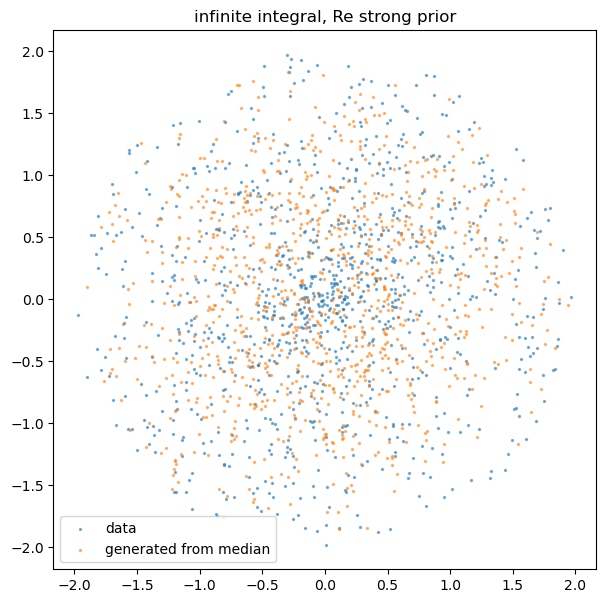

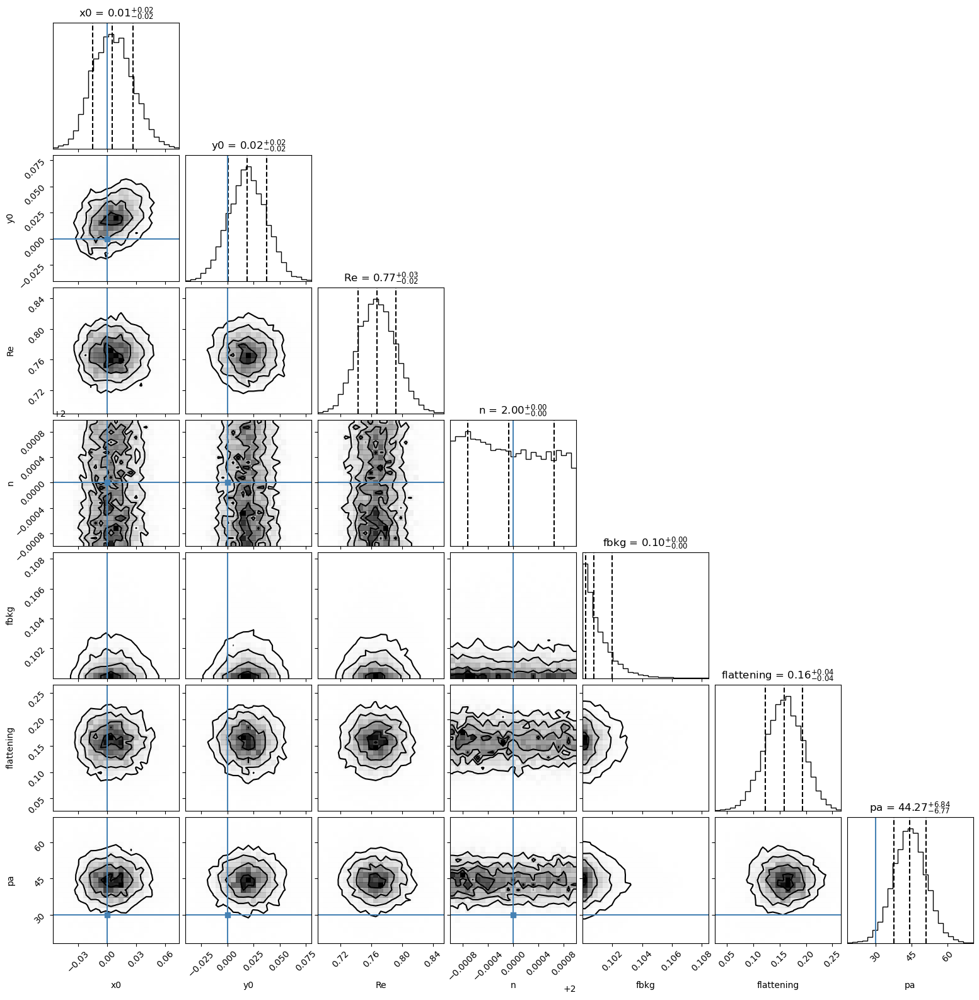

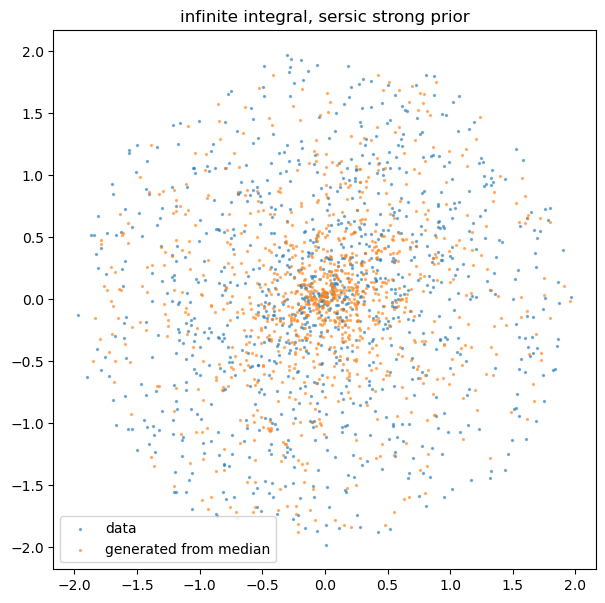

In [18]:
kwargs = dict(hullorrouter=2.,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=1,
                nsersic=2,
                fbkg=.5,
                flattening=0.4,
                pa=30*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.999,1.001)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')

# force sersic to be about right
kwargs['priorrngs'] = {'n': (1.999,2.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

Or an exponential distribution

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 36     | 1        | 4        | 40880    | N/A    | 10140 | -4783.69 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 43     | 1        | 4        | 48608    | N/A    | 11366 | -2719.50 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 32     | 1        | 4        | 36736    | N/A    | 10064 | -3122.72 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 39     | 1        | 4        | 44688    | N/A    | 11114 | -2

(56.119816064834595,
 59.193389892578125,
 40.63250255584717,
 57.31076264381409,
 52.14843535423279)

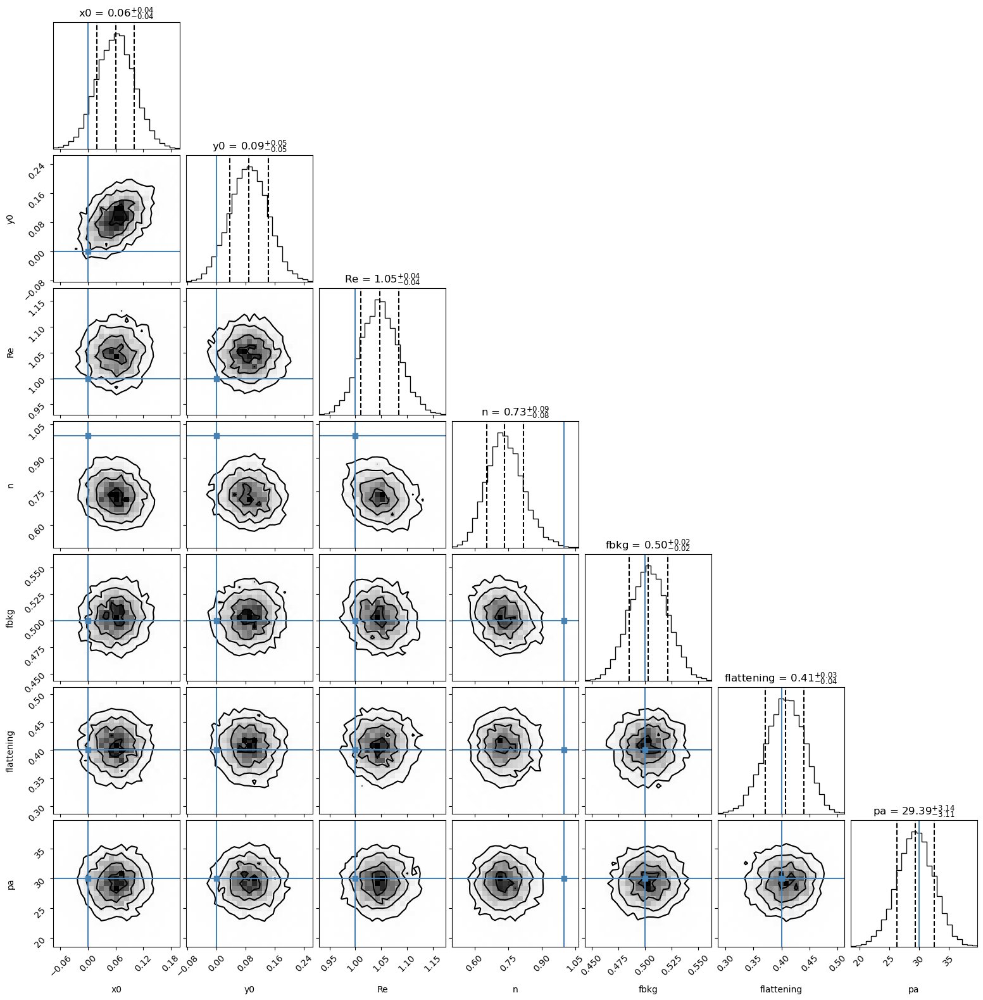

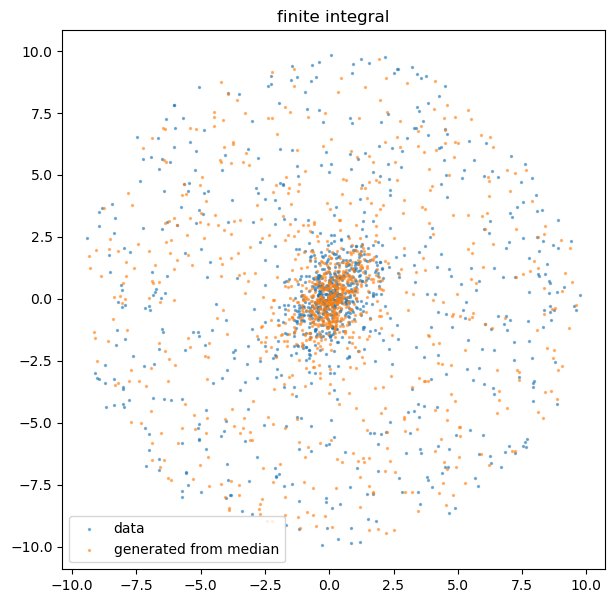

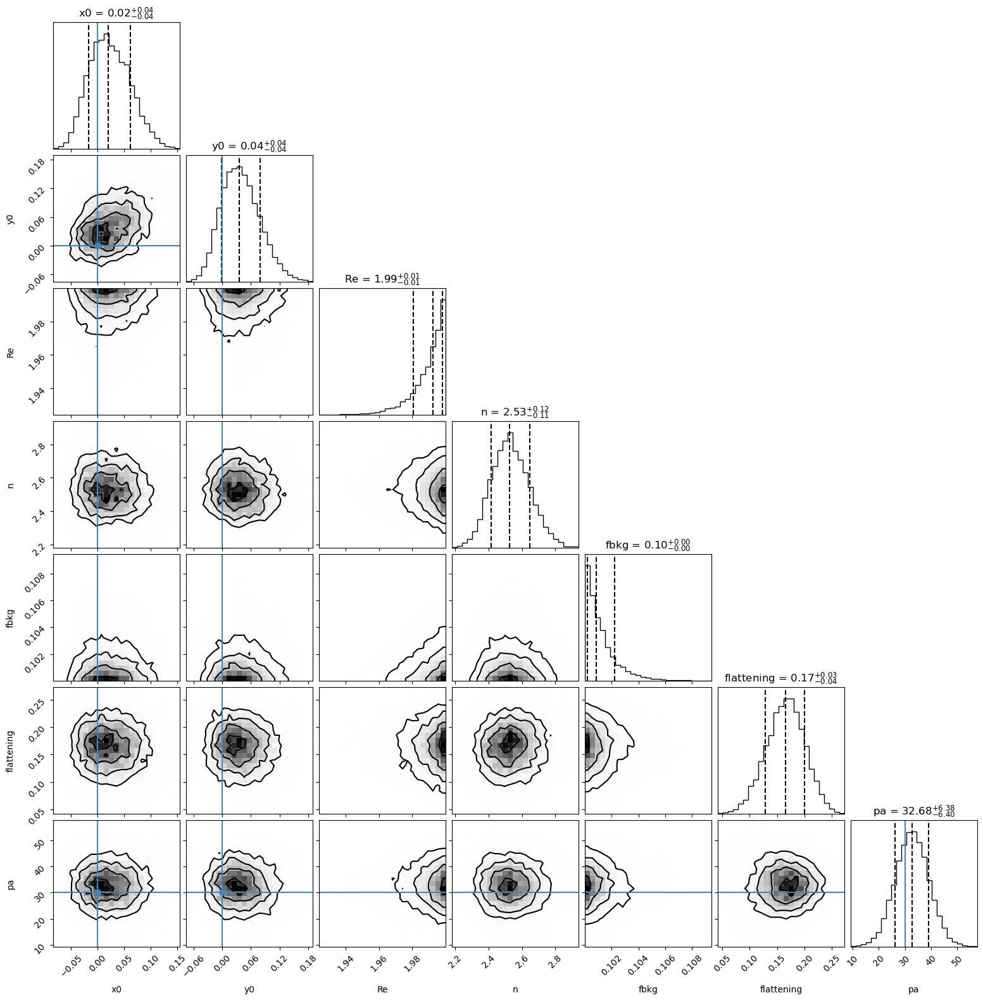

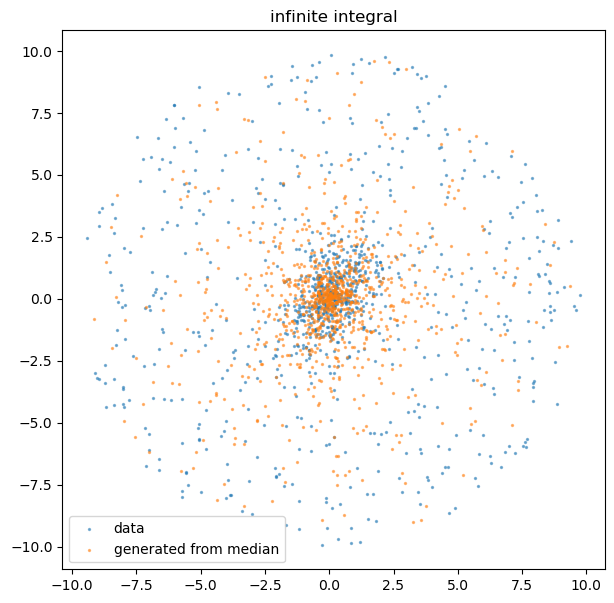

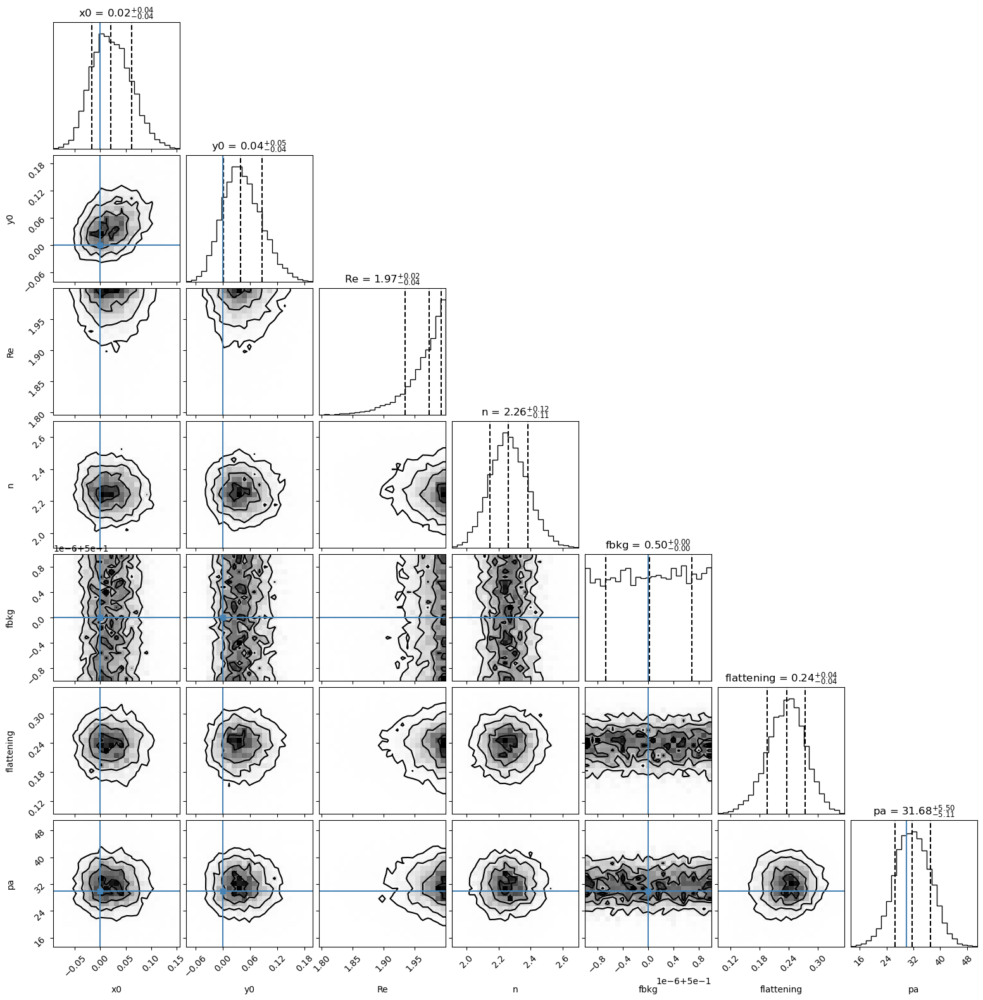

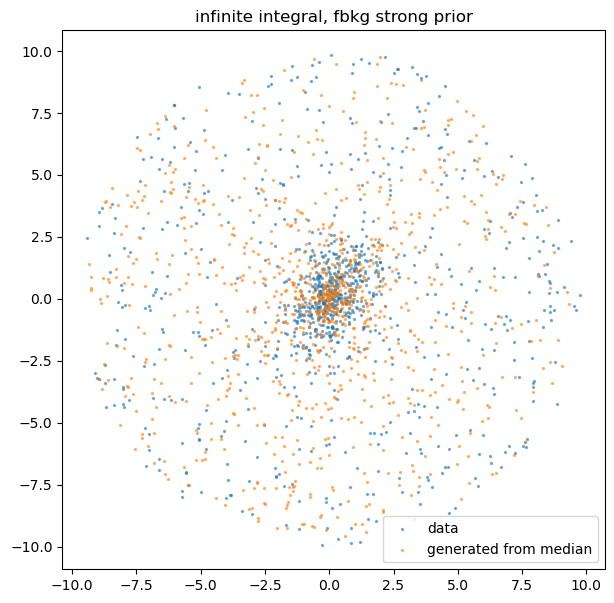

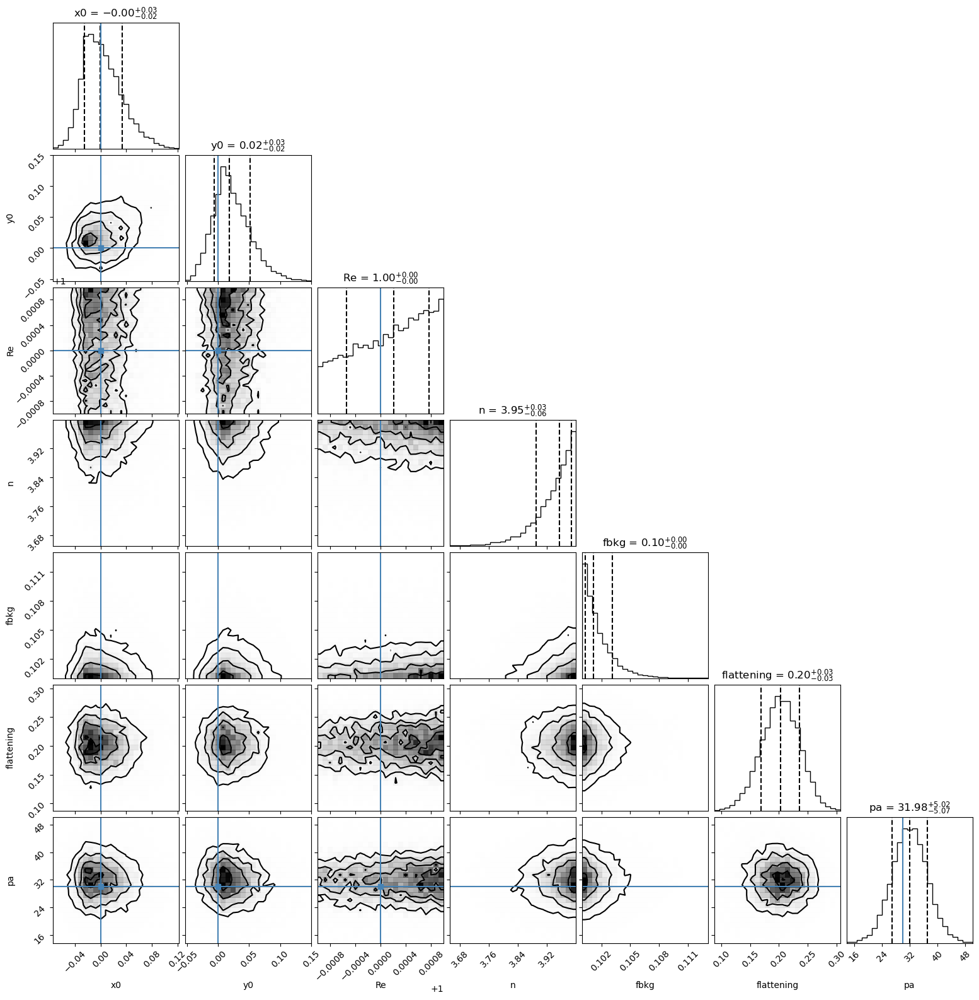

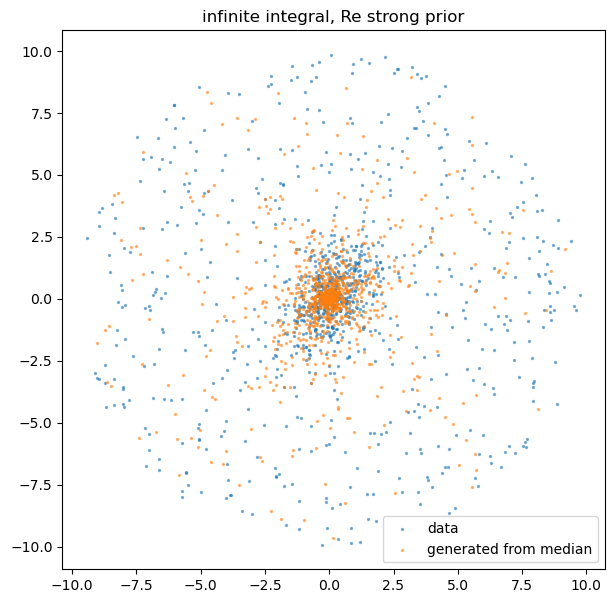

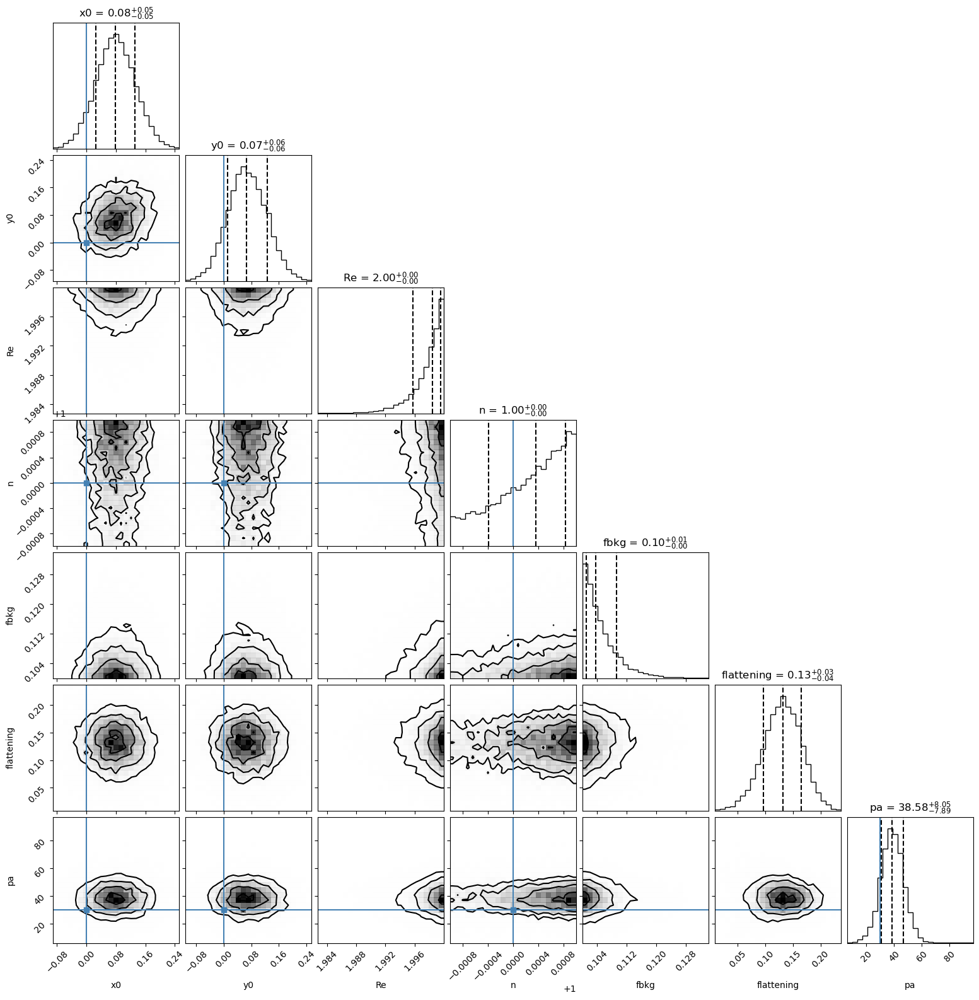

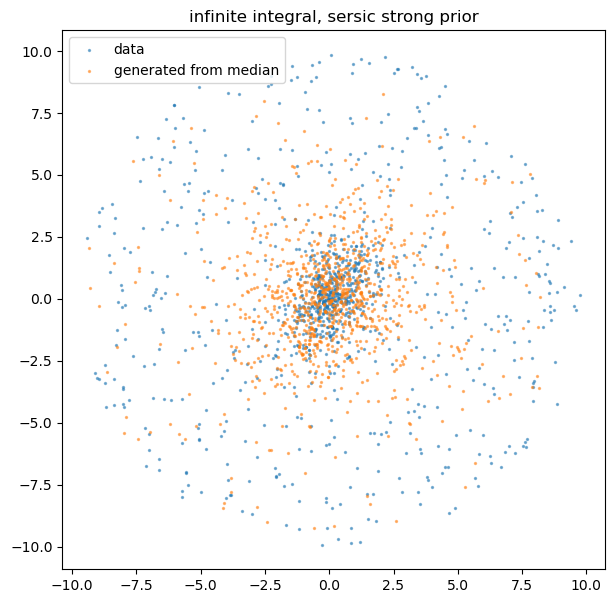

In [19]:
kwargs = dict(hullorrouter=10.,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=1,
                nsersic=1,
                fbkg=.5,
                flattening=0.4,
                pa=30*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.999,1.001)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')

# force sersic to be about right
kwargs['priorrngs'] = {'n': (.999,1.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

# Elongated/rectangular hulls?

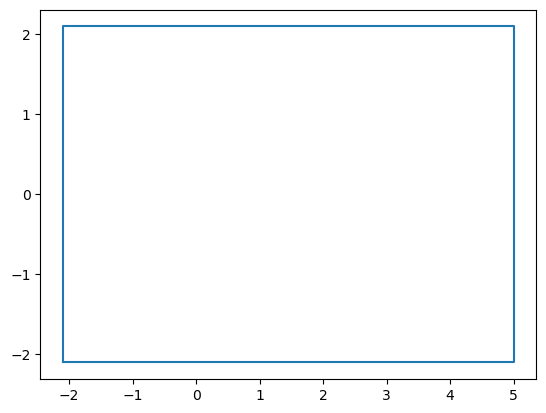

In [20]:
xhull = [-2.1, 5, 5, -2.1]
yhull = [-2.1, -2.1, 2.1,2.1]

rhull = spatial.ConvexHull(np.array((xhull, yhull)).T)
plot_hull(rhull)

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 31     | 1        | 4        | 36288    | N/A    | 10442 | -3053.29 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 43     | 1        | 4        | 48720    | N/A    | 10651 | -974.96  
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 33     | 1        | 4        | 37632    | N/A    | 10097 | -1404.80 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 40     | 1        | 4        | 44800    | N/A    | 10114 | -1

(43.890188217163086,
 56.18704843521118,
 42.298166036605835,
 51.59012007713318,
 49.40778160095215)

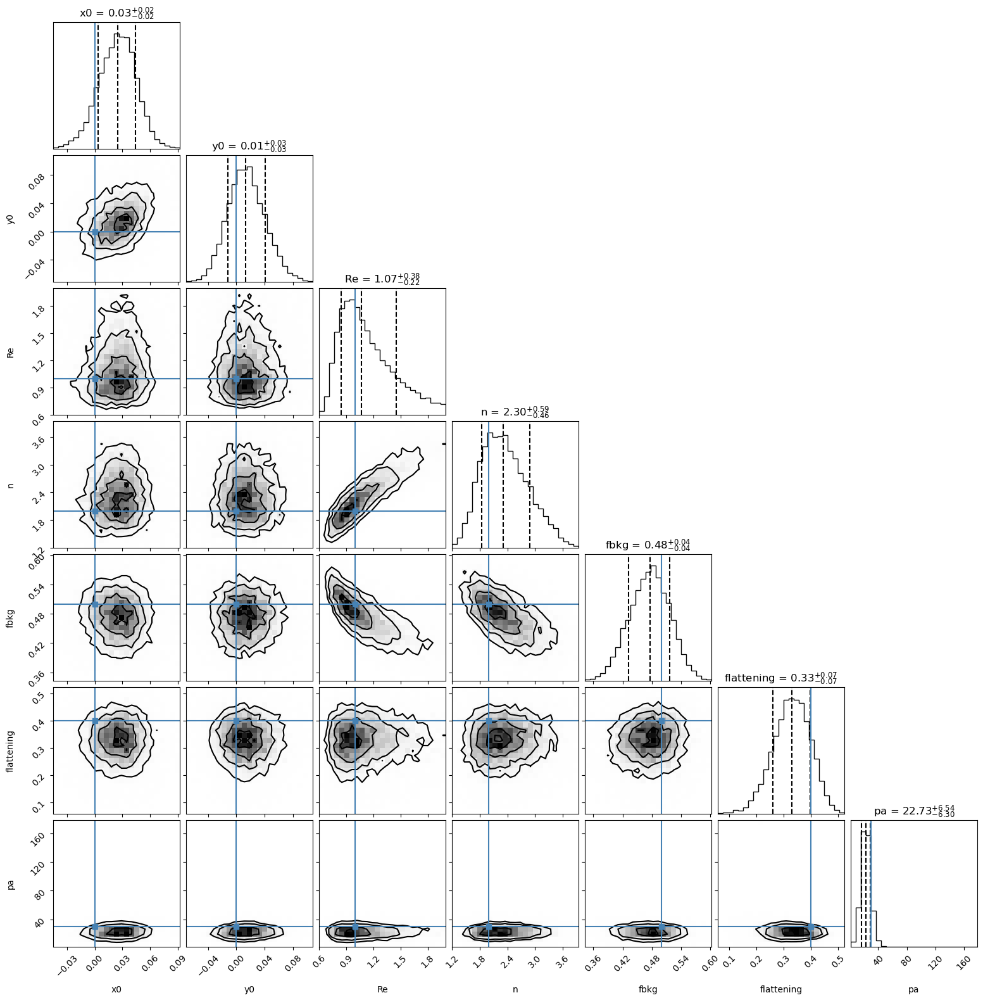

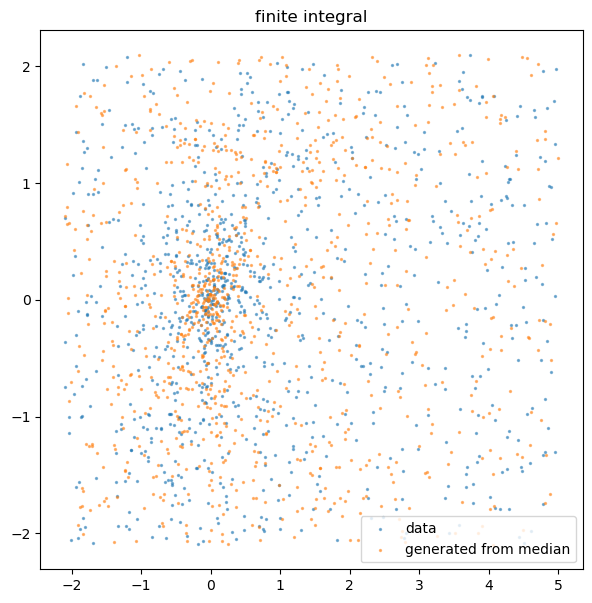

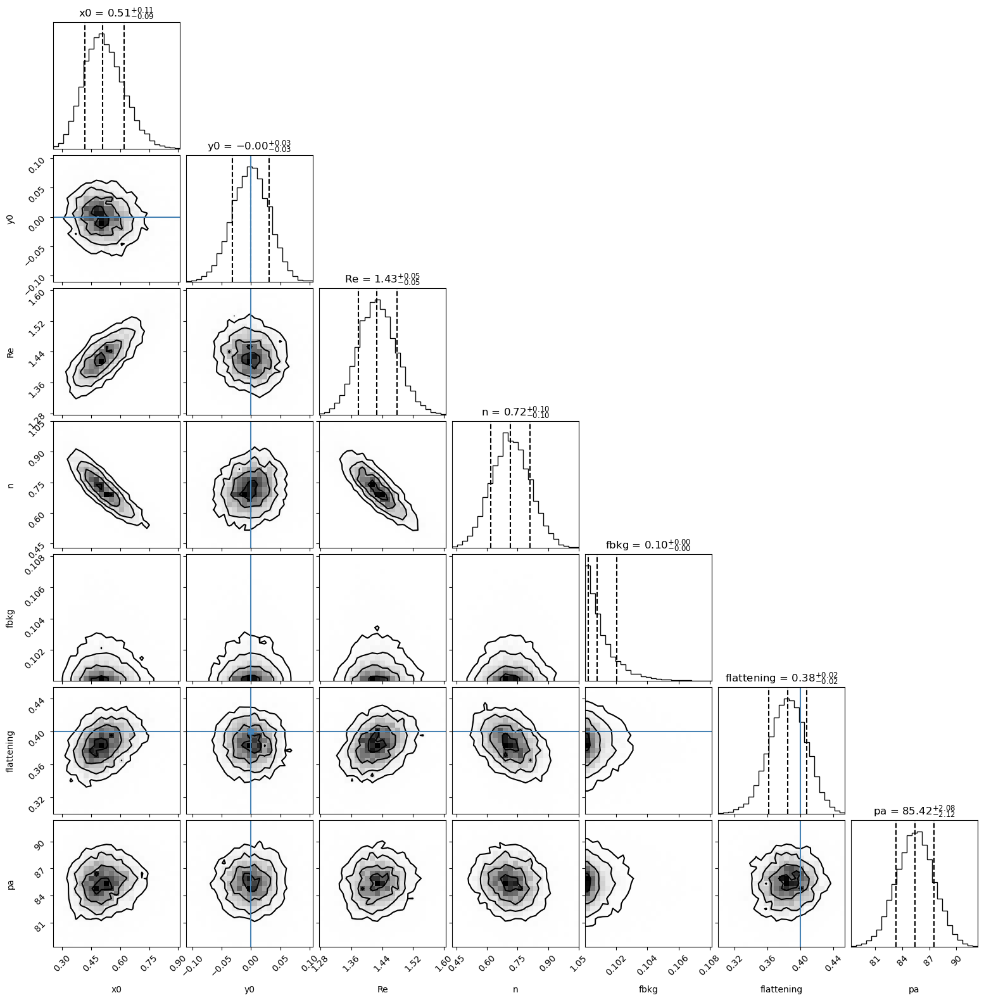

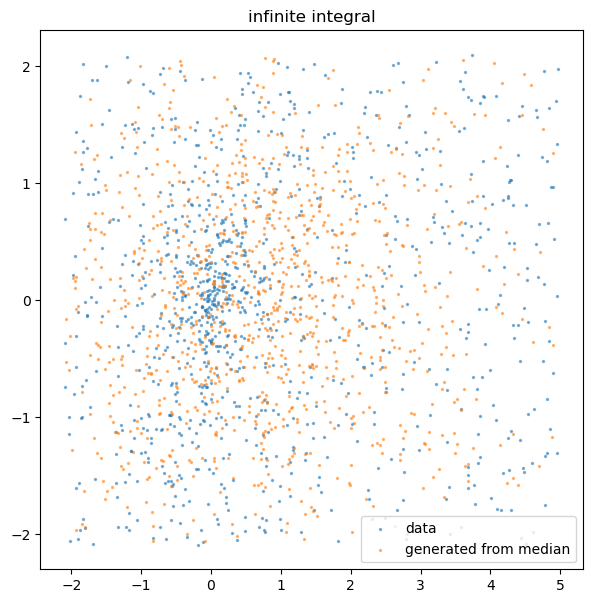

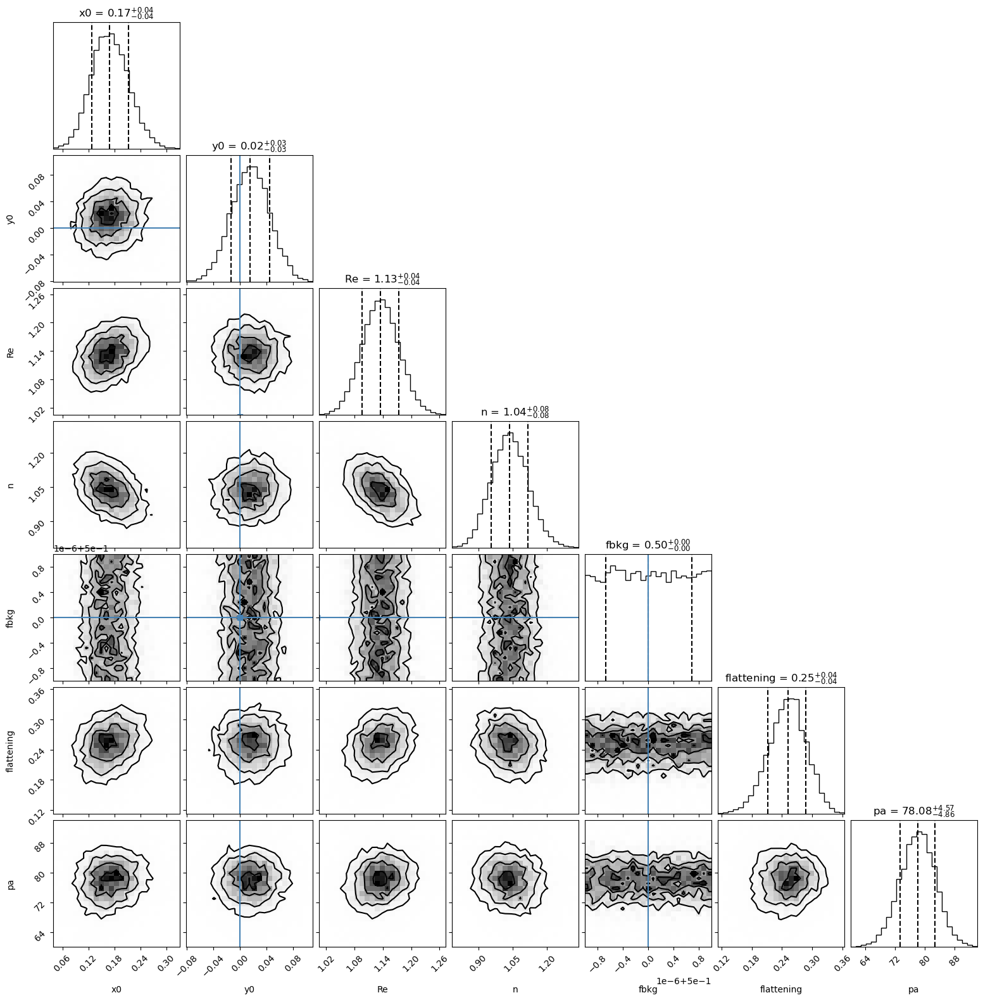

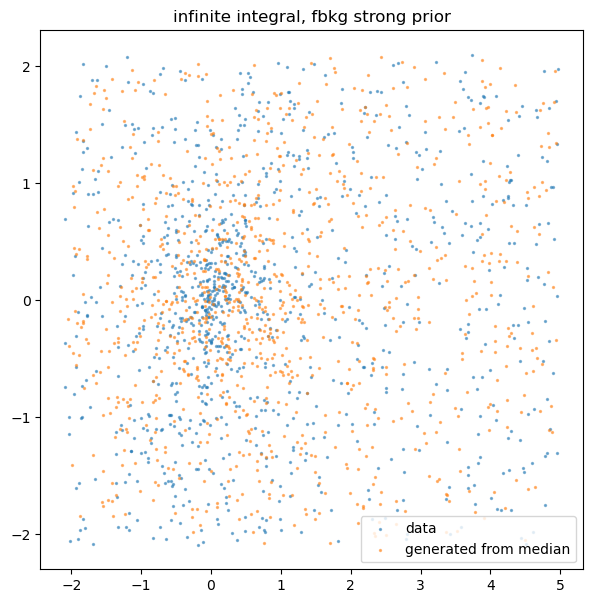

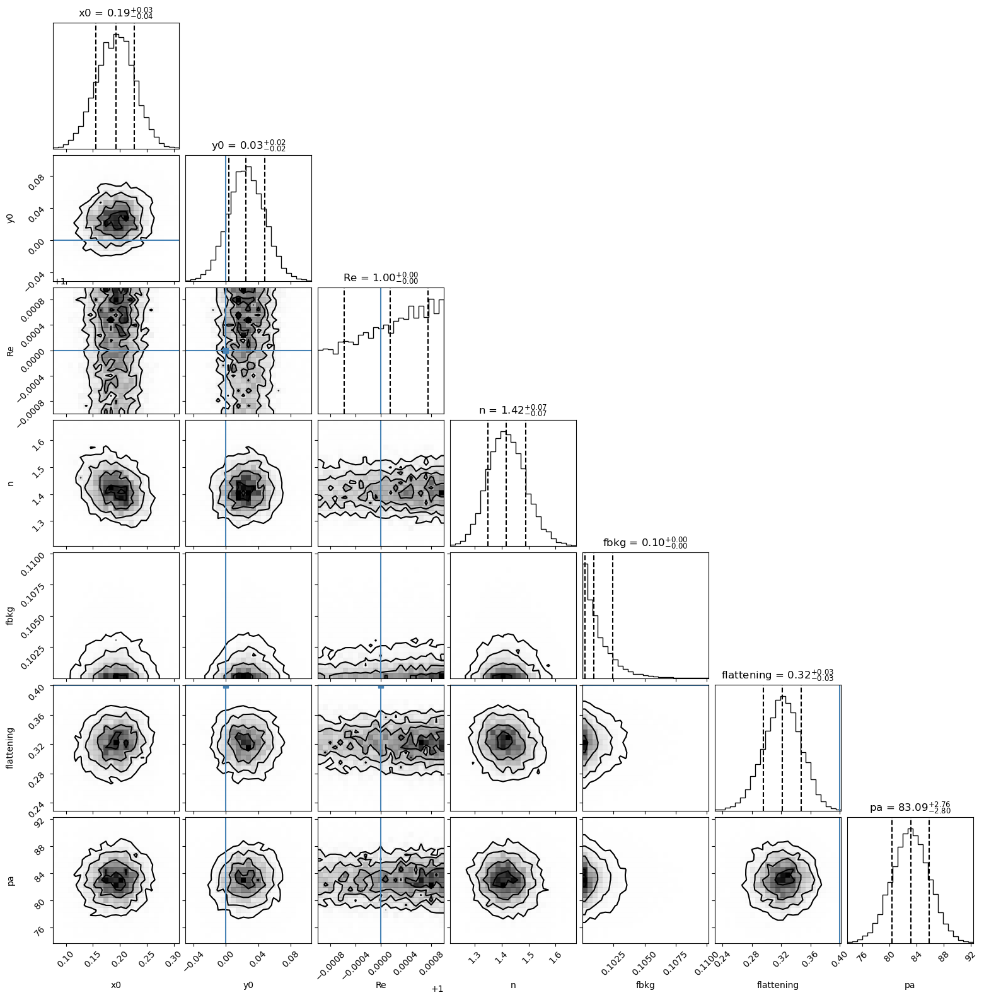

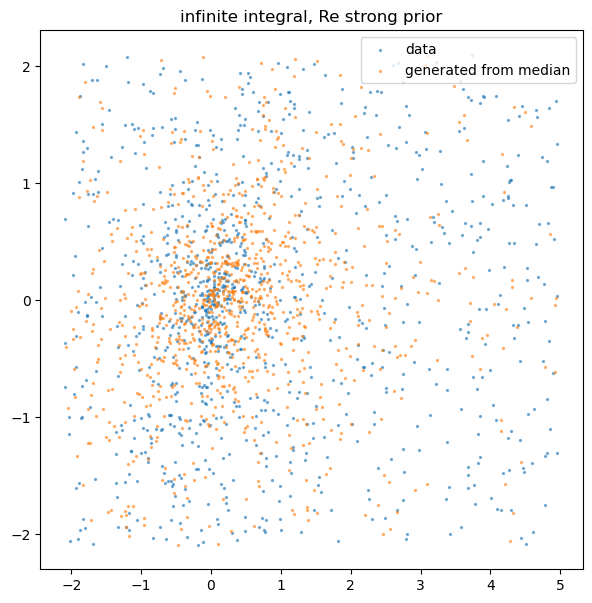

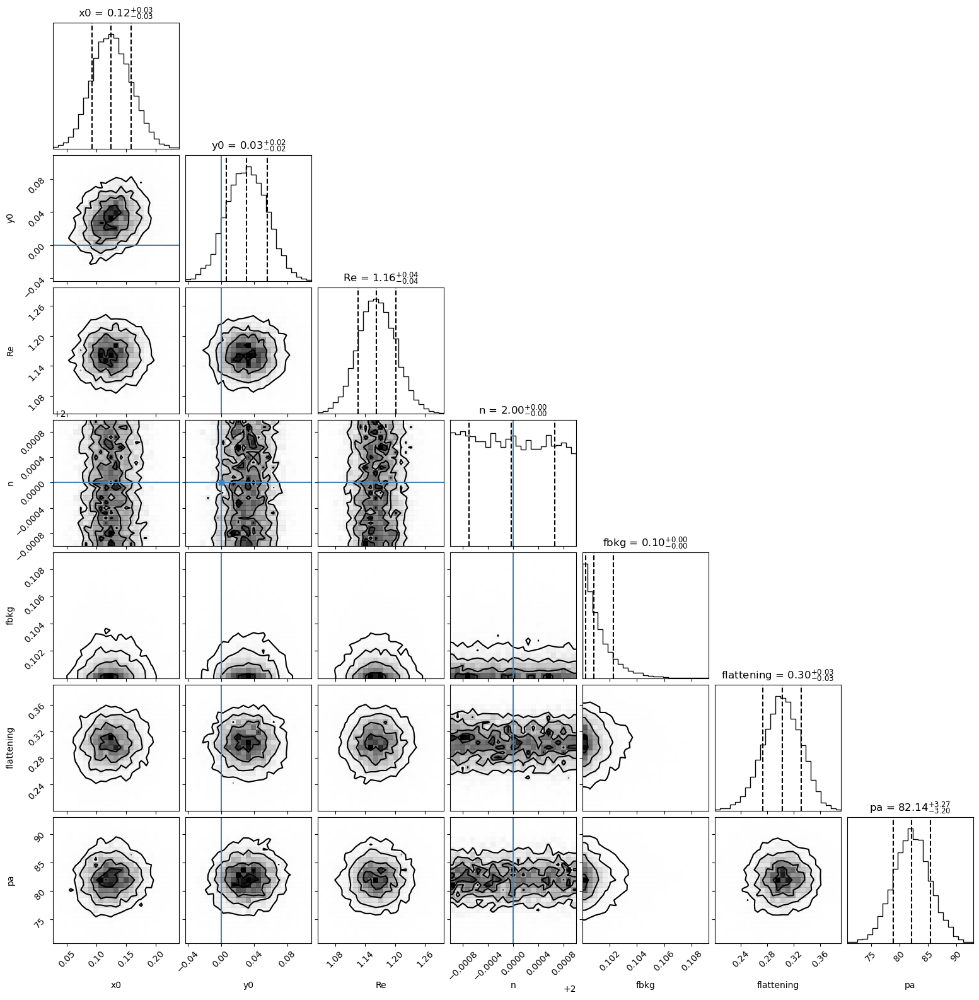

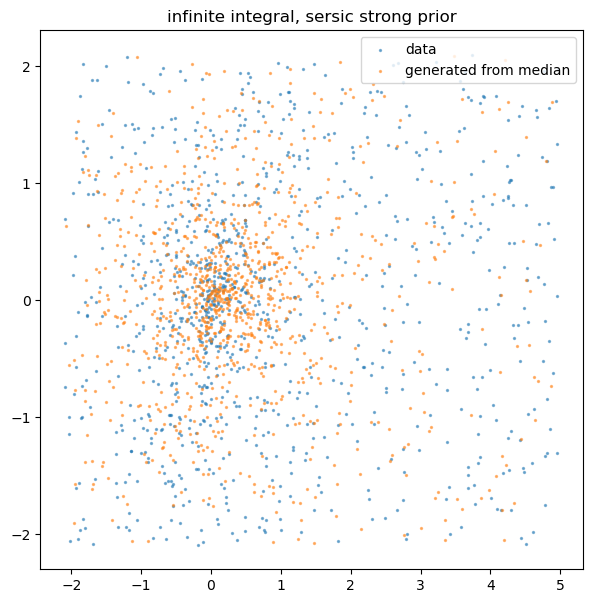

In [21]:
kwargs = dict(hullorrouter=rhull,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=1,
                nsersic=2,
                fbkg=.5,
                flattening=0.4,
                pa=30*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.999,1.001)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')

# force sersic to be about right
kwargs['priorrngs'] = {'n': (1.999,2.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

### Try a more bounded "chip"

And a slightly more pronounced flattening

Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 35     | 1        | 4        | 41664    | N/A    | 11264 | -1485.32 
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 45     | 1        | 4        | 51072    | N/A    | 10424 | +599.96  
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 35     | 1        | 4        | 39872    | N/A    | 10081 | +166.47  
Starting the nautilus sampler...
Please report issues at github.com/johannesulf/nautilus.
Status    | Bounds | Ellipses | Networks | Calls    | f_live | N_eff | log Z    
Finished  | 43     | 1        | 4        | 48272    | N/A    | 11377 | +5

(54.213119983673096,
 58.18864703178406,
 43.85061693191528,
 55.26843023300171,
 52.973084926605225)

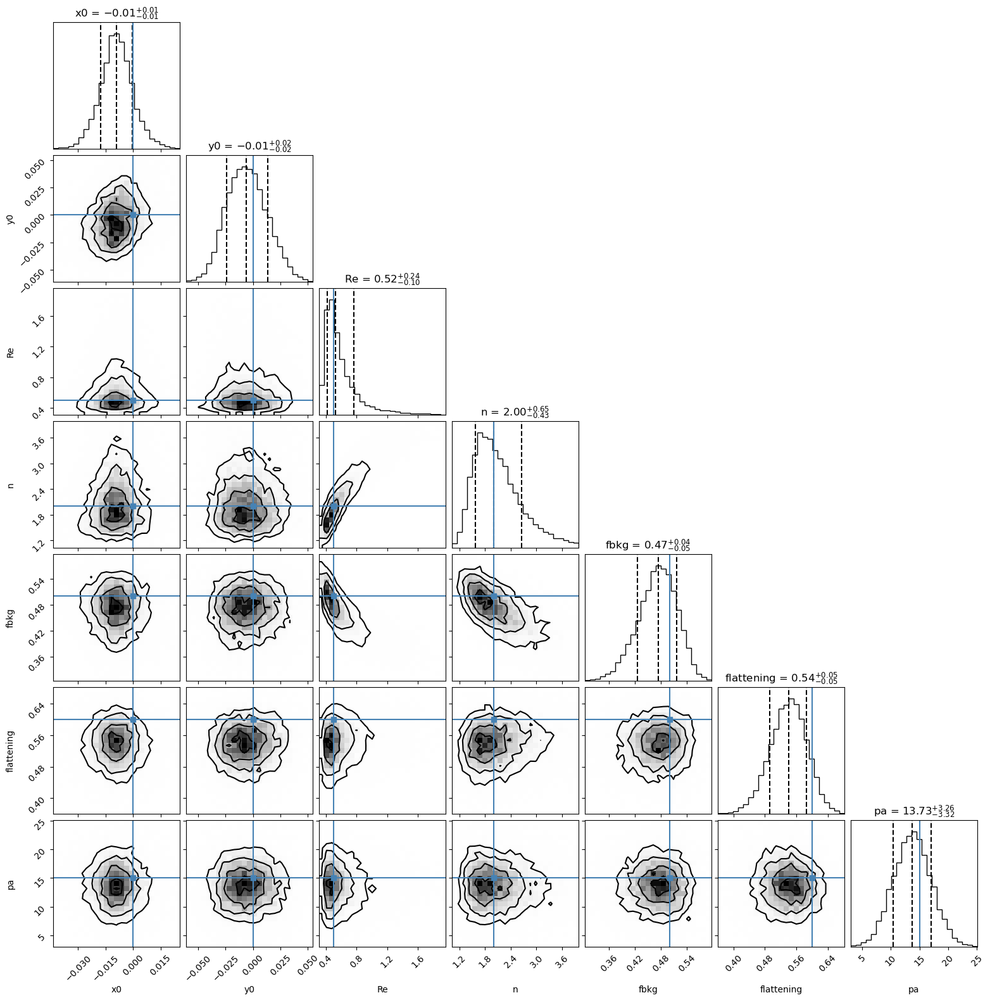

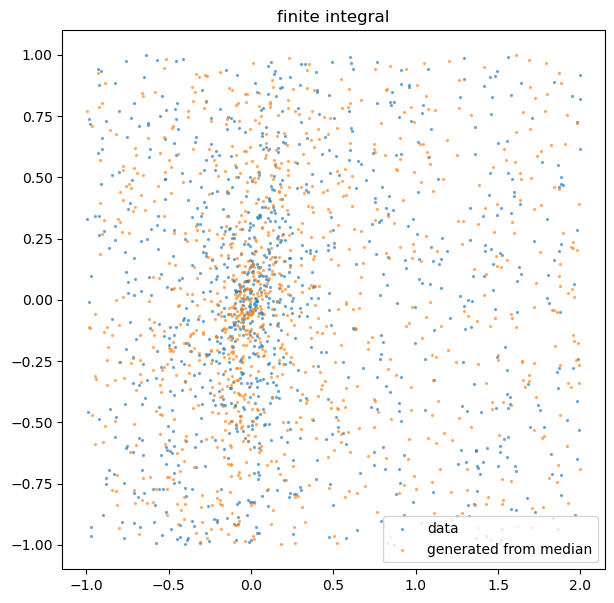

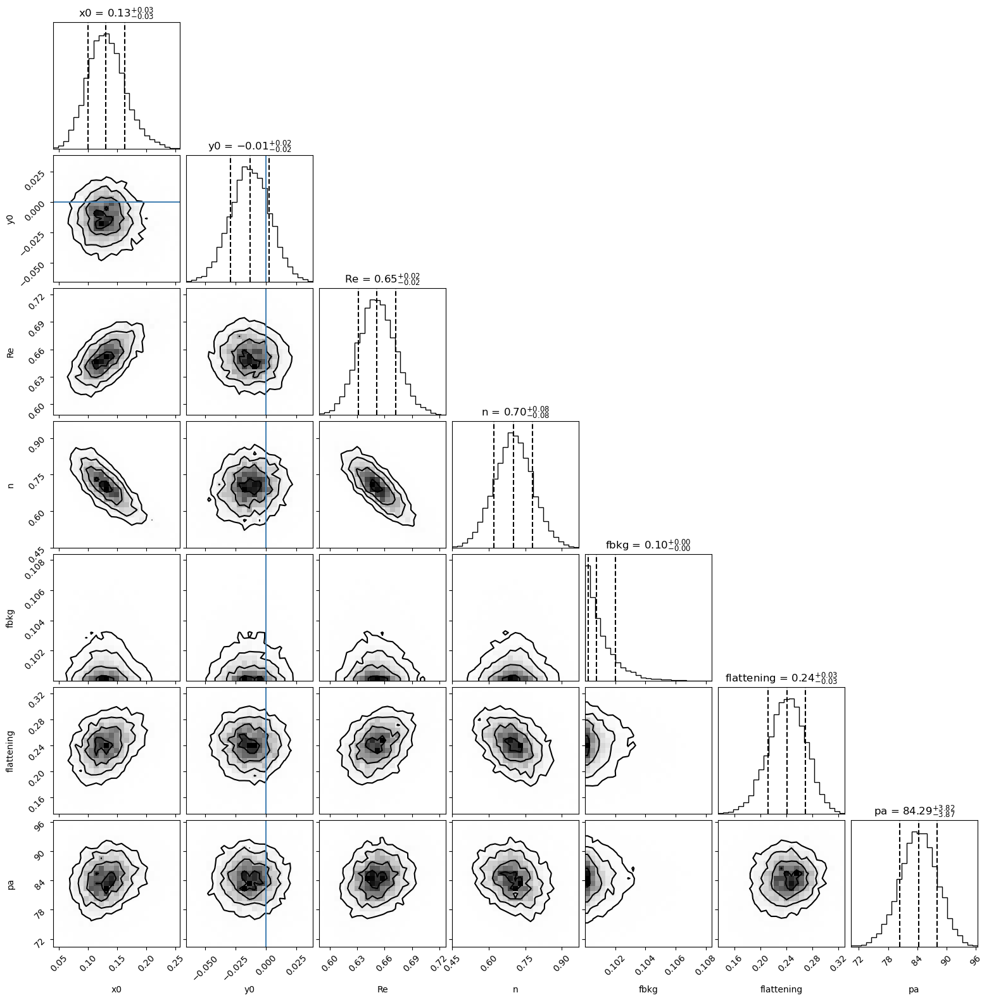

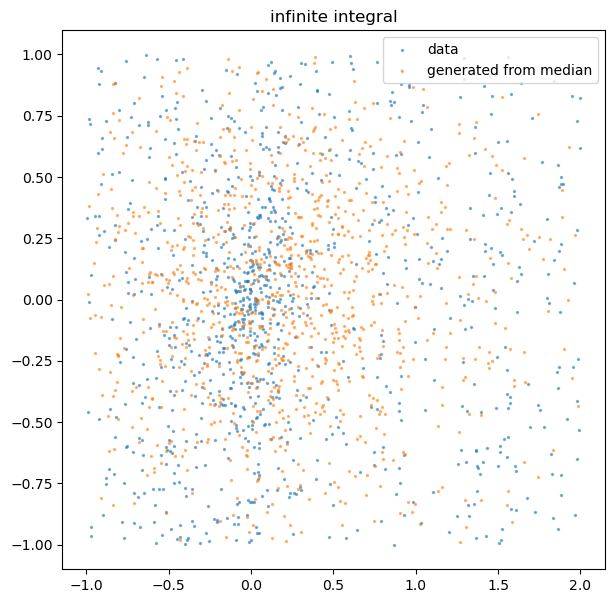

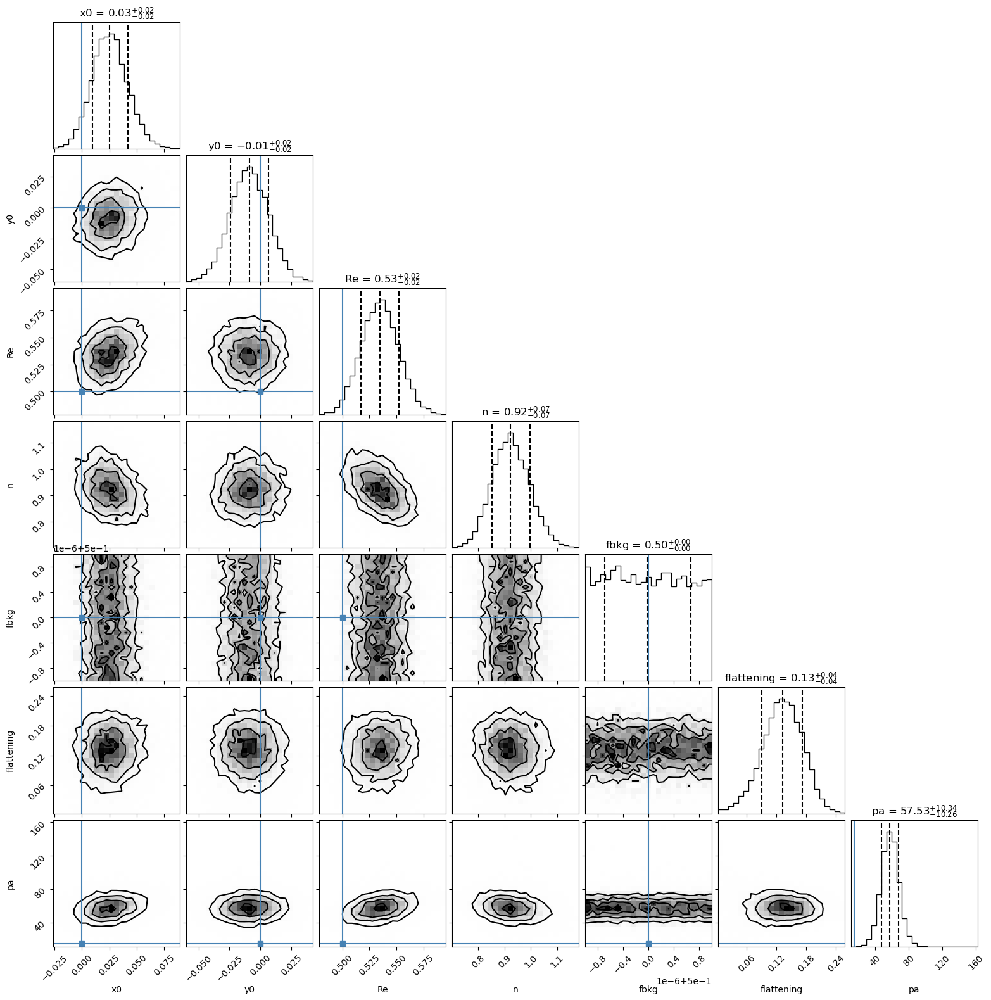

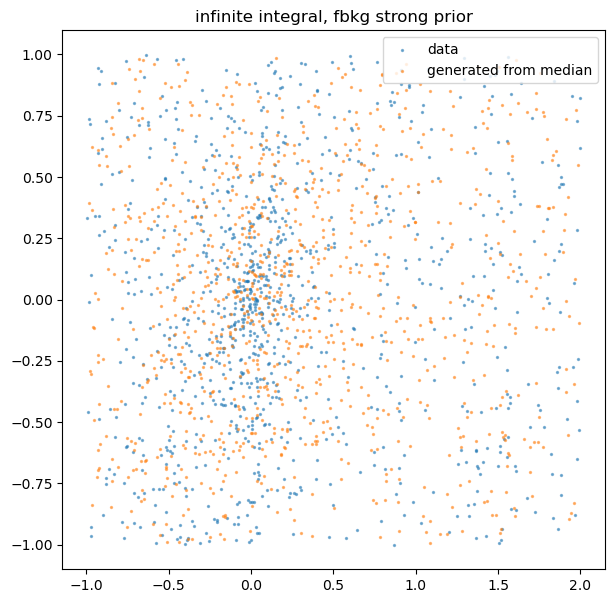

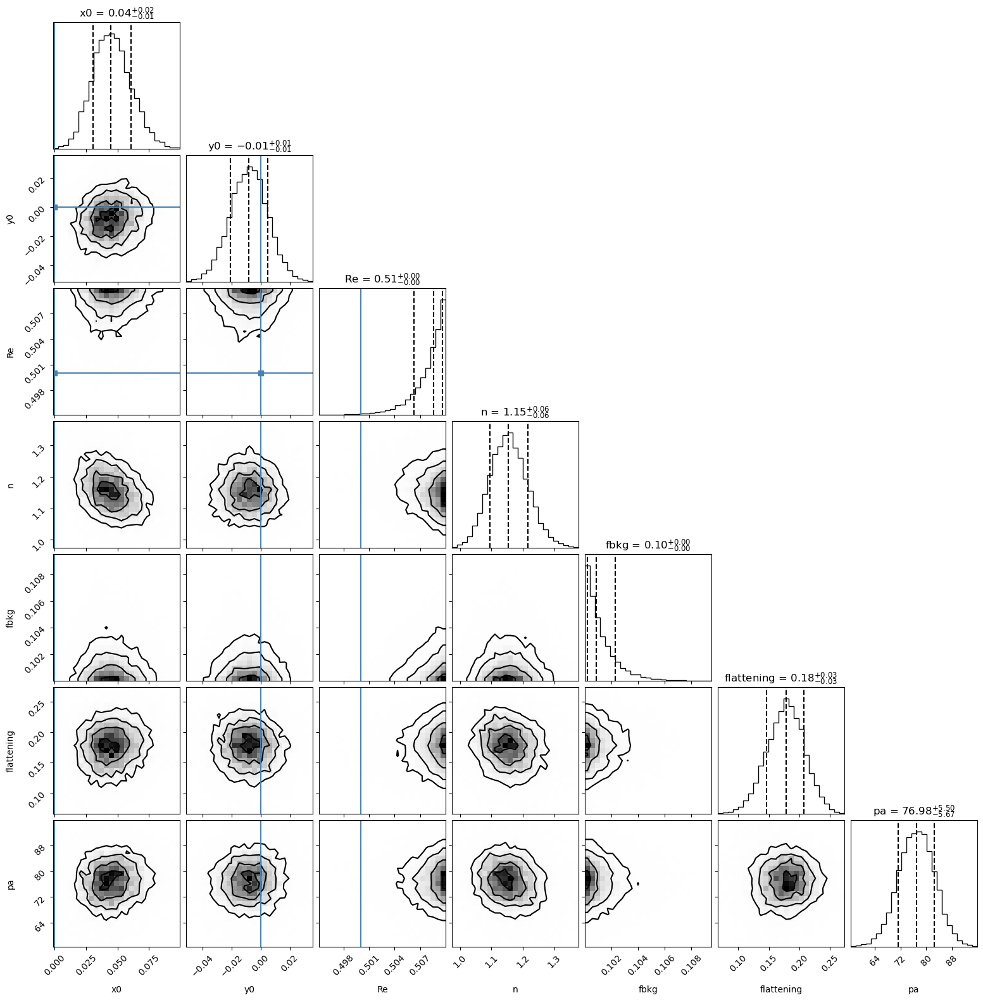

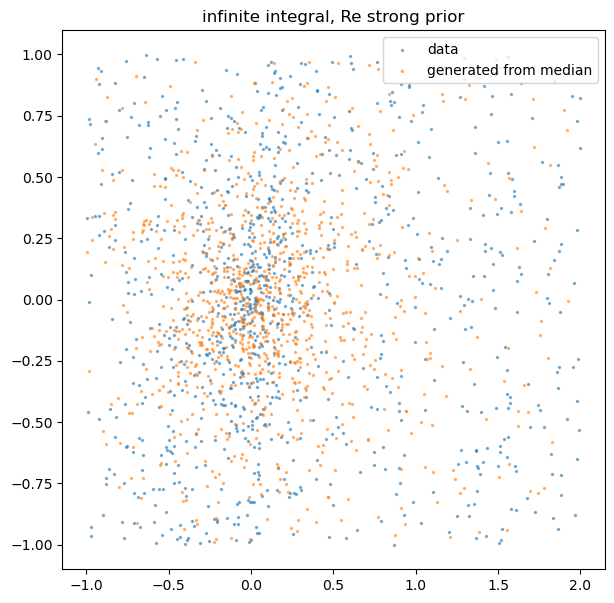

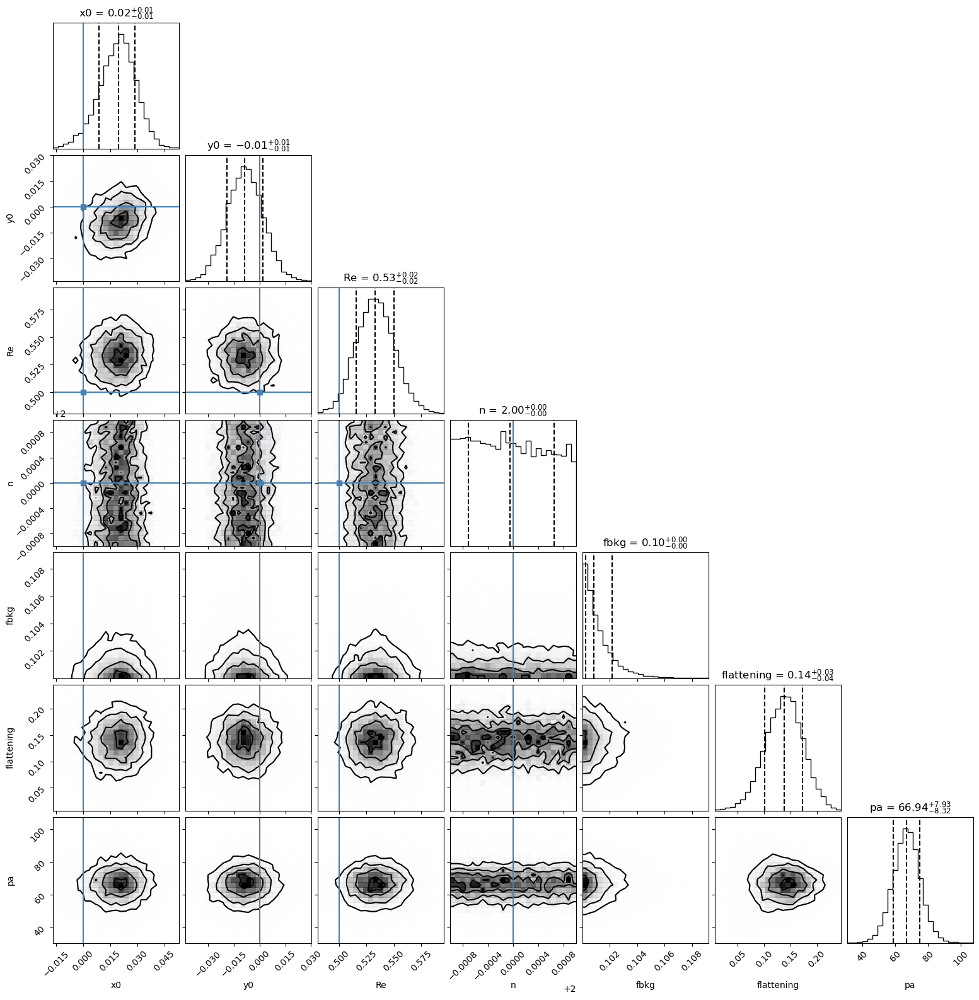

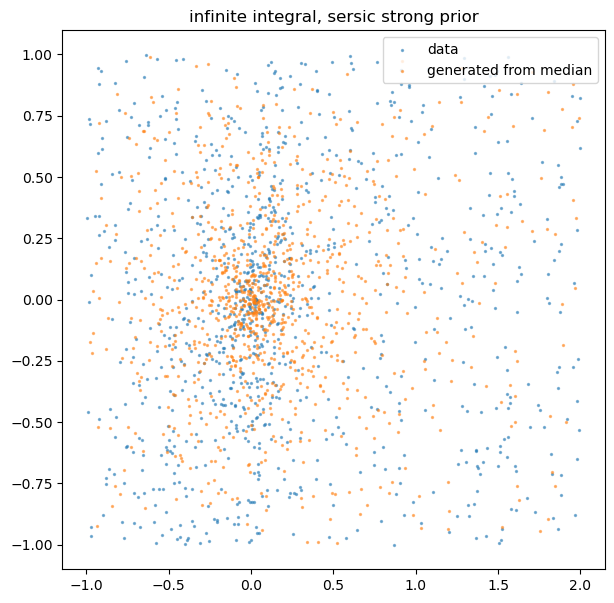

In [22]:
xhull = [-1, 2, 2, -1]
yhull = [-1, -1, 1,1]

rhull2 = spatial.ConvexHull(np.array((xhull, yhull)).T)


kwargs = dict(hullorrouter=rhull2,
                x0=0, # center of galaxy
                y0=0, # center of galaxy
                Re=0.5,
                nsersic=2,
                fbkg=.5,
                flattening=0.6,
                pa=15*u.deg,
                ntotal=1000,
                loglike=loglike)
figs1, sampler1, (xp, yp), dt1 = infer_and_plot(**kwargs)
plt.title('finite integral')

kwargs['hullorrouter'] = (xp, yp)
kwargs['loglike'] = loglike_inf
figs2, sampler2, _, dt2 = infer_and_plot(**kwargs)
plt.title('infinite integral')


# force the background fraction to be about right
kwargs['priorrngs'] = {'fbkg': (0.499999,0.500001)}
figs3, sampler3, _, dt3 = infer_and_plot(**kwargs)
plt.title('infinite integral, fbkg strong prior')

# force the size to be about right
kwargs['priorrngs'] = {'Re': (.49,.51)}
figs4, sampler4, _, dt4 = infer_and_plot(**kwargs)
plt.title('infinite integral, Re strong prior')
# force sersic to be about right
kwargs['priorrngs'] = {'n': (1.999,2.001)}
figs5, sampler5, _, dt5 = infer_and_plot(**kwargs)
plt.title('infinite integral, sersic strong prior')

dt1, dt2, dt3, dt4, dt5  # just to see how runtimes change

As expected, the estimated PA is aligned with the direction of the chip in the elongated case, but the hull fixes that 